In [1]:
import os
import numpy as np
import cv2
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
import albumentations as A
import matplotlib.pyplot as plt

# ====================
# CONFIGURATION
# ====================
BASE_PATH = r"C:\Users\Shafi.09\AnocondaProjects\BrainT\R_datasets"
PREPROCESSED_PATH = os.path.join(BASE_PATH, "preprocessed_masoud_nickparvar_dataset")
LABELS = ['glioma', 'meningioma', 'pituitary', 'notumor']
IMAGE_SIZE = 256
VAL_SPLIT = 0.2  # 20% of training data for validation
RANDOM_STATE = 42

# ====================
# DATA LOADING & PREPROCESSING
# ====================
def mri_preprocessing(image):
    """Enhanced MRI-specific preprocessing"""
    # Convert to grayscale if needed (handles both color and grayscale inputs)
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image
    
    # Contrast enhancement
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(gray)
    
    # Noise reduction
    blurred = cv2.medianBlur(enhanced, 3)
    
    # Resize and normalize
    processed = cv2.resize(blurred, (IMAGE_SIZE, IMAGE_SIZE))
    return np.expand_dims(processed/255.0, axis=-1)  # Add channel dimension

def load_data(directory):
    X, Y = [], []
    for label in LABELS:
        folder_path = os.path.join(directory, label)
        for img_name in os.listdir(folder_path):
            img_path = os.path.join(folder_path, img_name)
            img = cv2.imread(img_path, cv2.IMREAD_ANYCOLOR)
            if img is not None:
                processed = mri_preprocessing(img)
                X.append(processed)
                Y.append(label)
    return np.array(X), np.array(Y)

# Load ALL training data (will be split later)
print("Loading training data...")
X_train_all, Y_train_all = load_data(os.path.join(PREPROCESSED_PATH, "Training"))

# Load test data (untouched)
print("Loading test data...")
X_test, Y_test = load_data(os.path.join(PREPROCESSED_PATH, "Testing"))

# Split training data into train and validation sets
print(f"Splitting training data (validation: {VAL_SPLIT*100}%)...")
X_train, X_val, Y_train, Y_val = train_test_split(
    X_train_all, Y_train_all, 
    test_size=VAL_SPLIT, 
    stratify=Y_train_all,  # Maintain class distribution
    random_state=RANDOM_STATE
)

# Encode labels
def encode_labels(Y):
    return tf.keras.utils.to_categorical([LABELS.index(y) for y in Y], num_classes=len(LABELS))

Y_train = encode_labels(Y_train)
Y_val = encode_labels(Y_val)
Y_test = encode_labels(Y_test)

# Shuffle training data
X_train, Y_train = shuffle(X_train, Y_train, random_state=RANDOM_STATE)

Loading training data...
Loading test data...
Splitting training data (validation: 20.0%)...


In [2]:
# ====================
# DATA AUGMENTATION
# ====================
def augment_images(images: np.ndarray) -> np.ndarray:
    """Conservative MRI augmentation preserving diagnostic features"""
    transform = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Rotate(limit=15, p=0.7, border_mode=cv2.BORDER_CONSTANT),
    ])

    aug_images = []
    for img in images:
        augmented = transform(image=img[..., 0])['image']
        aug_images.append(augmented[..., np.newaxis])  # Maintain channel dim
    
    return np.array(aug_images)

print("\nAugmenting training data...")
X_train_aug = augment_images(X_train)
Y_train_aug = Y_train.copy()

# Combine and shuffle to create FINAL training set
X_train_final = np.concatenate([X_train, X_train_aug], axis=0)
Y_train_final = np.concatenate([Y_train, Y_train_aug], axis=0)
X_train_final, Y_train_final = shuffle(X_train_final, Y_train_final, random_state=RANDOM_STATE)

print(f"Original training samples: {len(X_train)}")
print(f"Augmented training samples: {len(X_train_aug)}")
print(f"Final training samples: {len(X_train_final)}")

# ====================
# DATASET ANALYSIS
# ====================
def print_class_distribution(Y, dataset_name):
    class_counts = np.sum(Y, axis=0)
    print(f"\n{dataset_name} class distribution:")
    for i, label in enumerate(LABELS):
        print(f"{label}: {class_counts[i]} samples")
    print(f"Total: {len(Y)} samples")

def print_shapes():
    print("\nDataset Shapes:")
    print(f"FINAL TRAINING SET: X_train_final: {X_train_final.shape}, Y_train_final: {Y_train_final.shape}")
    print(f"Validation set: X_val: {X_val.shape}, Y_val: {Y_val.shape}")
    print(f"Test set: X_test: {X_test.shape}, Y_test: {Y_test.shape}")

print_class_distribution(Y_train_final, "Final Training Set")
print_class_distribution(Y_val, "Validation Set")
print_class_distribution(Y_test, "Test Set")
print_shapes()


Augmenting training data...
Original training samples: 4416
Augmented training samples: 4416
Final training samples: 8832

Final Training Set class distribution:
glioma: 2114.0 samples
meningioma: 2132.0 samples
pituitary: 2312.0 samples
notumor: 2274.0 samples
Total: 8832 samples

Validation Set class distribution:
glioma: 264.0 samples
meningioma: 267.0 samples
pituitary: 289.0 samples
notumor: 285.0 samples
Total: 1105 samples

Test Set class distribution:
glioma: 299.0 samples
meningioma: 302.0 samples
pituitary: 295.0 samples
notumor: 309.0 samples
Total: 1205 samples

Dataset Shapes:
FINAL TRAINING SET: X_train_final: (8832, 256, 256, 1), Y_train_final: (8832, 4)
Validation set: X_val: (1105, 256, 256, 1), Y_val: (1105, 4)
Test set: X_test: (1205, 256, 256, 1), Y_test: (1205, 4)



DATASET DISTRIBUTION VISUALIZATION


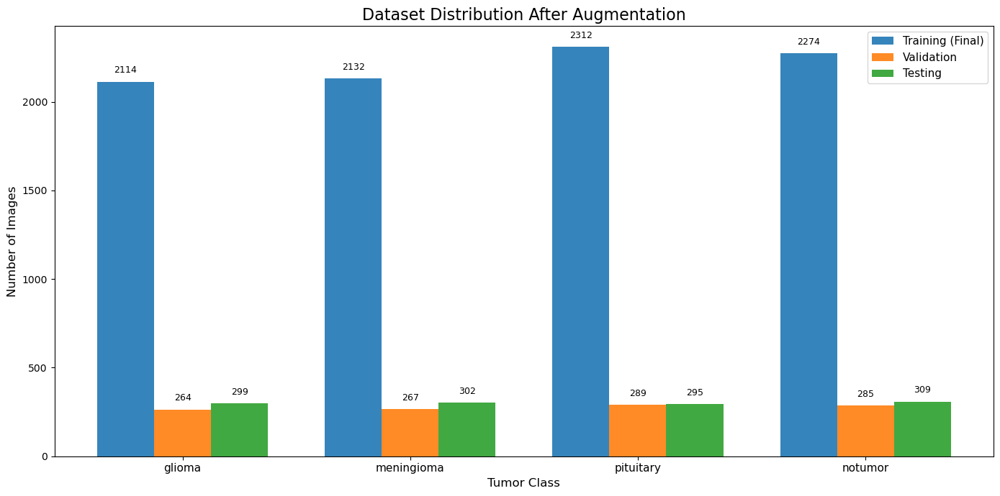


SAMPLE IMAGE VISUALIZATION
Final Training Set Samples:


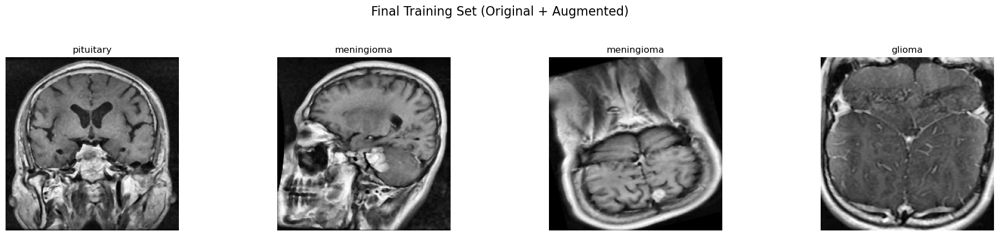


Validation Set Samples:


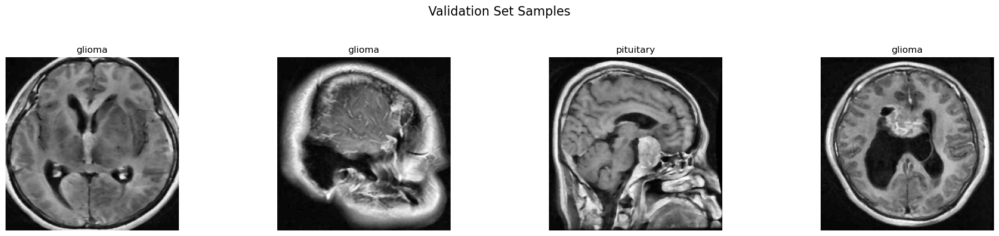


Test Set Samples:


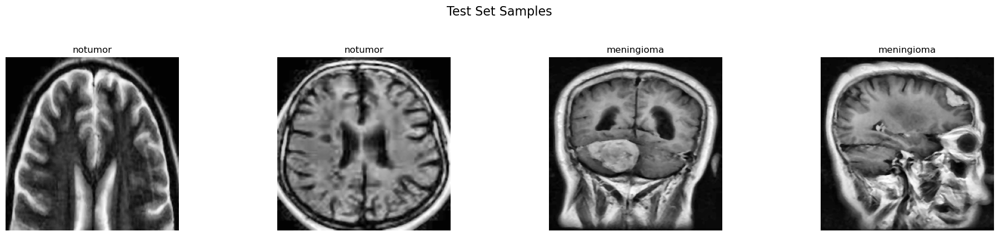


INTENSITY HISTOGRAM ANALYSIS
Training Set Intensity Distribution:


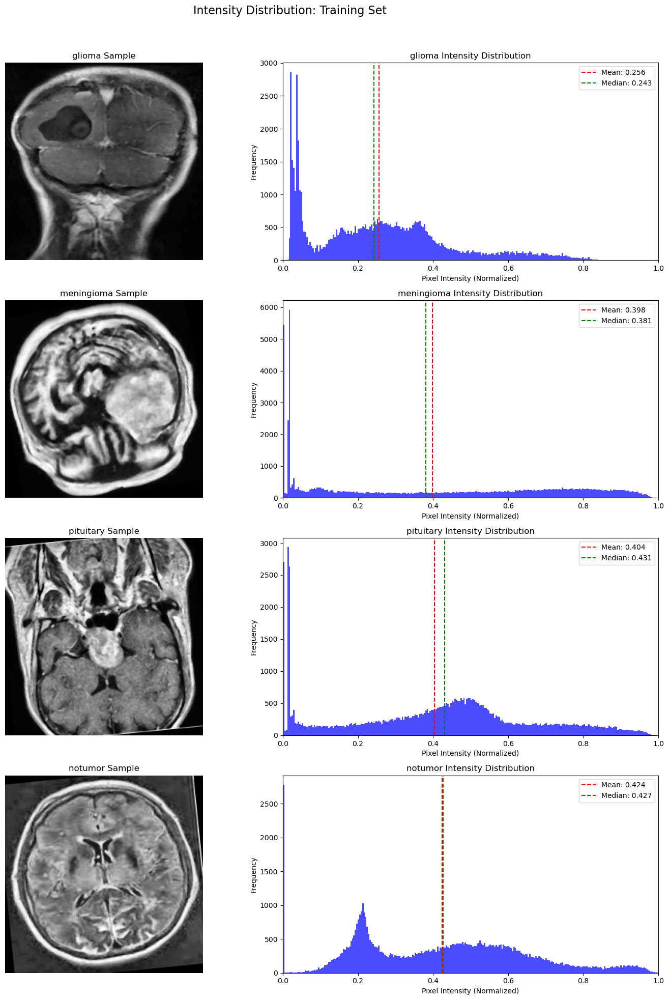


Validation Set Intensity Distribution:


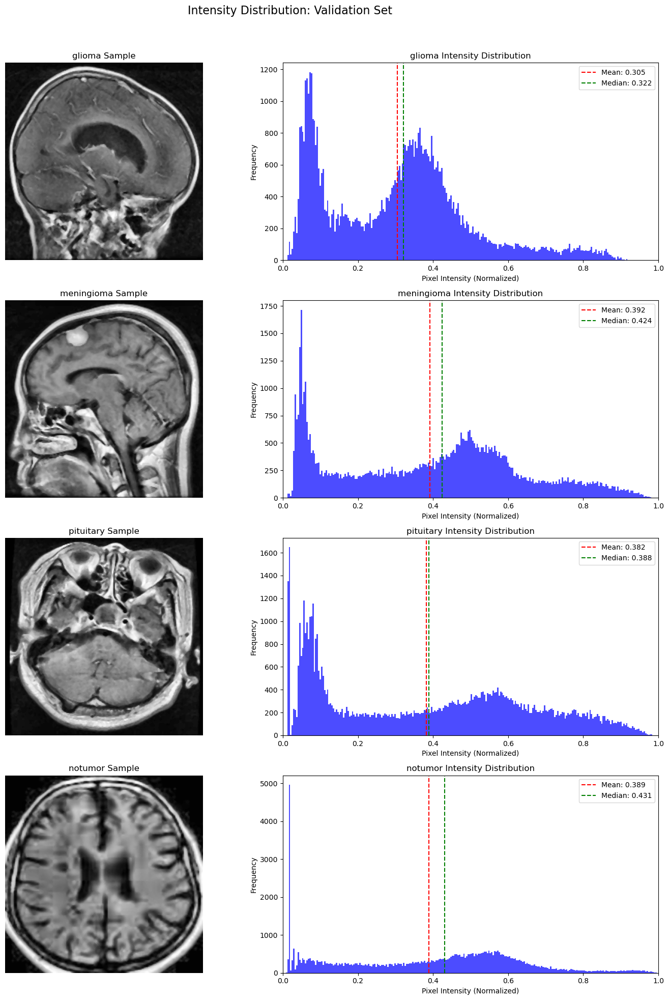


Test Set Intensity Distribution:


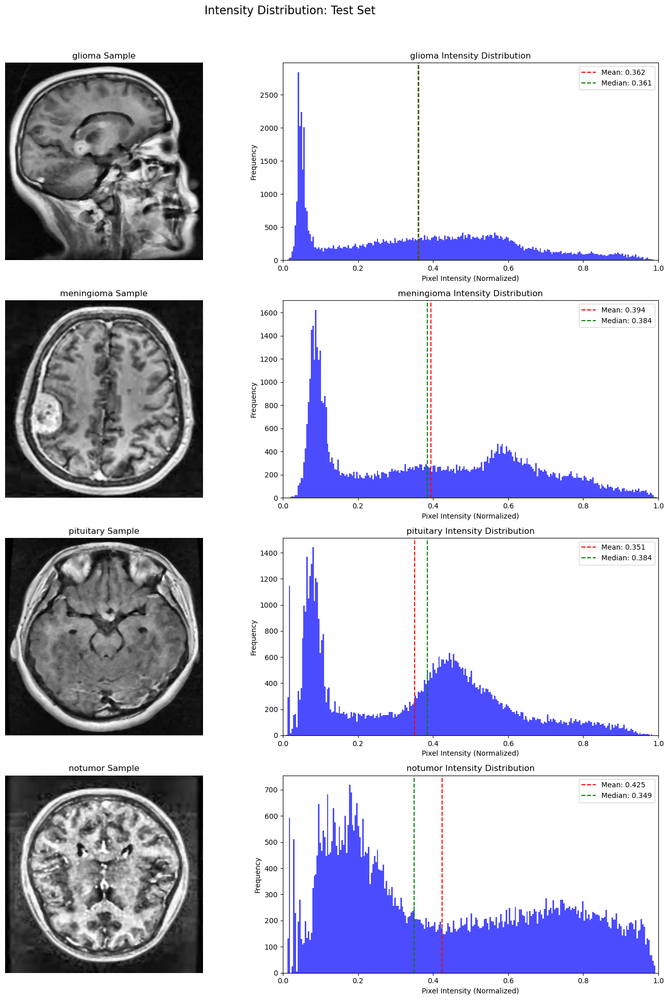


AUGMENTATION QUALITY CHECK


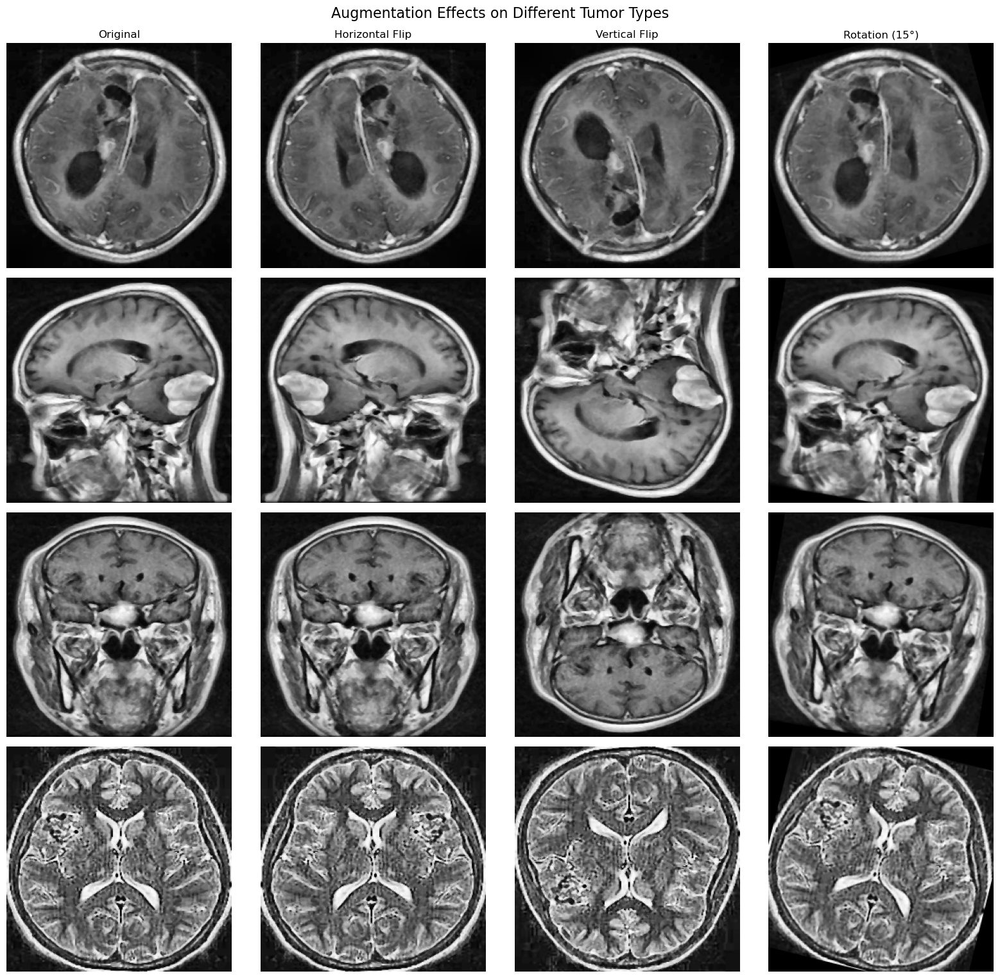

In [3]:
# ====================
# VISUALIZATION FUNCTIONS (FIXED & OPTIMIZED)
# ====================
def plot_samples(images, labels, title, num_samples=5):
    plt.figure(figsize=(15, 3))
    plt.suptitle(title, fontsize=16)
    indices = np.random.choice(range(len(images)), num_samples)
    
    for i, idx in enumerate(indices):
        plt.subplot(1, num_samples, i+1)
        plt.imshow(images[idx][..., 0], cmap='gray')
        class_idx = np.argmax(labels[idx])
        plt.title(f"{LABELS[class_idx]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

def plot_dataset_distribution(Y_train_final, Y_val, Y_test):
    train_counts = np.sum(Y_train_final, axis=0)
    val_counts = np.sum(Y_val, axis=0)
    test_counts = np.sum(Y_test, axis=0)
    
    fig, ax = plt.subplots(figsize=(14, 7))
    width = 0.25
    x = np.arange(len(LABELS))
    
    ax.bar(x - width, train_counts, width, label="Training (Final)", alpha=0.9)
    ax.bar(x, val_counts, width, label="Validation", alpha=0.9)
    ax.bar(x + width, test_counts, width, label="Testing", alpha=0.9)
    
    ax.set_xlabel("Tumor Class", fontsize=12)
    ax.set_ylabel("Number of Images", fontsize=12)
    ax.set_title("Dataset Distribution After Augmentation", fontsize=16)
    ax.set_xticks(x)
    ax.set_xticklabels(LABELS, fontsize=11)
    ax.legend(fontsize=11)
    
    for i, v in enumerate(train_counts):
        ax.text(i - width, v + 50, str(int(v)), ha='center', fontsize=9)
    for i, v in enumerate(val_counts):
        ax.text(i, v + 50, str(int(v)), ha='center', fontsize=9)
    for i, v in enumerate(test_counts):
        ax.text(i + width, v + 50, str(int(v)), ha='center', fontsize=9)
    
    plt.tight_layout()
    plt.show()

def display_sample_images(images, labels, title, n=4):
    fig, axes = plt.subplots(1, n, figsize=(20, 4))
    fig.suptitle(title, fontsize=16, y=1.05)
    
    indices = np.random.choice(range(len(images)), n, replace=False)
    
    for i, idx in enumerate(indices):
        img = images[idx]
        if img.shape[-1] == 1:
            img = np.squeeze(img, axis=-1)
        axes[i].imshow(img, cmap='gray')
        class_idx = np.argmax(labels[idx])
        axes[i].set_title(f"{LABELS[class_idx]}", fontsize=12)
        axes[i].axis("off")
    
    plt.tight_layout()
    plt.show()

def plot_intensity_histograms(images, labels, title):
    # Create a 4x2 grid (4 tumor types, 2 plots per type)
    fig, axs = plt.subplots(4, 2, figsize=(15, 20))
    fig.suptitle(f"Intensity Distribution: {title}", fontsize=16, y=0.98)
    
    for class_idx, class_name in enumerate(LABELS):
        # Get random sample from this class
        class_indices = np.where(np.argmax(labels, axis=1) == class_idx)[0]
        img = images[np.random.choice(class_indices)]
        
        # Squeeze if single channel
        if img.shape[-1] == 1:
            img = np.squeeze(img, axis=-1)
        
        # Image plot
        ax_img = axs[class_idx, 0]
        ax_img.imshow(img, cmap='gray')
        ax_img.set_title(f"{class_name} Sample", fontsize=12)
        ax_img.axis('off')
        
        # Histogram plot
        ax_hist = axs[class_idx, 1]
        ax_hist.hist(img.ravel(), bins=256, range=(0, 1), alpha=0.7, color='blue')
        ax_hist.set_xlim(0, 1)
        ax_hist.set_title(f"{class_name} Intensity Distribution", fontsize=12)
        ax_hist.set_xlabel("Pixel Intensity (Normalized)")
        ax_hist.set_ylabel("Frequency")
        
        # Add statistical markers
        mean_val = np.mean(img)
        median_val = np.median(img)
        ax_hist.axvline(x=mean_val, color='red', linestyle='--', label=f'Mean: {mean_val:.3f}')
        ax_hist.axvline(x=median_val, color='green', linestyle='--', label=f'Median: {median_val:.3f}')
        ax_hist.legend(fontsize=10)
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle
    plt.show()

def compare_augmentation_effects(images, labels):
    # Create 4x4 grid (4 tumor types, 4 augmentation types)
    fig, axes = plt.subplots(4, 4, figsize=(16, 16))
    fig.suptitle("Augmentation Effects on Different Tumor Types", fontsize=16, y=0.95)
    
    # Define augmentations to demonstrate
    augmentations = {
        "Original": A.NoOp(),
        "Horizontal Flip": A.HorizontalFlip(p=1),
        "Vertical Flip": A.VerticalFlip(p=1),
        "Rotation (15°)": A.Rotate(limit=15, p=1, border_mode=cv2.BORDER_CONSTANT)
    }
    
    # For each tumor class
    for row_idx, class_name in enumerate(LABELS):
        # Get a random sample of this class
        class_indices = np.where(np.argmax(labels, axis=1) == row_idx)[0]
        orig_img = images[np.random.choice(class_indices)]
        
        # Squeeze if single channel
        if orig_img.shape[-1] == 1:
            orig_img = np.squeeze(orig_img, axis=-1)
        
        # Apply each augmentation
        for col_idx, (aug_name, aug) in enumerate(augmentations.items()):
            augmented = aug(image=orig_img)['image']
            ax = axes[row_idx, col_idx]
            ax.imshow(augmented, cmap='gray')
            
            # Set row and column titles
            if row_idx == 0:
                ax.set_title(aug_name, fontsize=12)
            if col_idx == 0:
                ax.set_ylabel(class_name, fontsize=12)
                
            ax.axis('off')
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle
    plt.show()

# ====================
# QUALITATIVE ANALYSIS (OPTIMIZED)
# ====================
print("\n" + "="*50)
print("DATASET DISTRIBUTION VISUALIZATION")
print("="*50)
plot_dataset_distribution(Y_train_final, Y_val, Y_test)

print("\n" + "="*50)
print("SAMPLE IMAGE VISUALIZATION")
print("="*50)
print("Final Training Set Samples:")
display_sample_images(X_train_final, Y_train_final, "Final Training Set (Original + Augmented)")

print("\nValidation Set Samples:")
display_sample_images(X_val, Y_val, "Validation Set Samples")

print("\nTest Set Samples:")
display_sample_images(X_test, Y_test, "Test Set Samples")

print("\n" + "="*50)
print("INTENSITY HISTOGRAM ANALYSIS")
print("="*50)
print("Training Set Intensity Distribution:")
plot_intensity_histograms(X_train_final, Y_train_final, "Training Set")

print("\nValidation Set Intensity Distribution:")
plot_intensity_histograms(X_val, Y_val, "Validation Set")

print("\nTest Set Intensity Distribution:")
plot_intensity_histograms(X_test, Y_test, "Test Set")

print("\n" + "="*50)
print("AUGMENTATION QUALITY CHECK")
print("="*50)
# Use original training images before augmentation
compare_augmentation_effects(X_train, Y_train)

In [4]:
from tensorflow import keras
from tensorflow.keras import regularizers, layers
import tensorflow as tf

# ===================================================
# Depthwise Separable CBAM (DSCBAM)
# ===================================================
class DSCBAM(keras.layers.Layer):
    """Ultra-light CBAM with depthwise spatial and grouped channel attention"""
    def __init__(self, reduction_ratio=16, groups=4, **kwargs):
        super().__init__(**kwargs)
        self.reduction_ratio = reduction_ratio
        self.groups = groups
        
    def build(self, input_shape):
        channels = input_shape[-1]
        self.channels = channels
        
        # ===== Grouped Channel Attention =====
        self.group_dense = []
        group_size = channels // self.groups
        for _ in range(self.groups):
            self.group_dense.append(keras.Sequential([
                layers.Dense(
                    max(1, group_size // self.reduction_ratio),
                    activation='relu',
                    kernel_initializer='he_normal'
                ),
                layers.Dense(
                    group_size,
                    kernel_initializer='he_normal'
                )
            ]))
        
        # ===== Depthwise Spatial Attention =====
        self.spatial_path = keras.Sequential([
            # Asymmetric depthwise conv (7x1 + 1x7)
            layers.DepthwiseConv2D((7,1), padding='same'),
            layers.DepthwiseConv2D((1,7), padding='same'),
            layers.Conv2D(1, (1,1), activation='sigmoid')
        ])
        
        super().build(input_shape)
        
    def call(self, inputs):
        # ===== Grouped Channel Attention =====
        # Split into groups
        group_features = tf.split(inputs, self.groups, axis=-1)
        group_attentions = []
        
        # Process each group independently
        for i in range(self.groups):
            gap = tf.reduce_mean(group_features[i], axis=[1,2], keepdims=True)
            gmp = tf.reduce_max(group_features[i], axis=[1,2], keepdims=True)
            
            # Process both pooling paths
            gap_out = self.group_dense[i](gap)
            gmp_out = self.group_dense[i](gmp)
            
            group_att = tf.sigmoid(gap_out + gmp_out)
            group_attentions.append(group_features[i] * group_att)
        
        channel_refined = tf.concat(group_attentions, axis=-1)
        
        # ===== Depthwise Spatial Attention =====
        gap_spatial = tf.reduce_mean(channel_refined, axis=-1, keepdims=True)
        gmp_spatial = tf.reduce_max(channel_refined, axis=-1, keepdims=True)
        spatial_concat = tf.concat([gap_spatial, gmp_spatial], axis=-1)
        
        spatial_att = self.spatial_path(spatial_concat)
        return channel_refined * spatial_att
        
    def get_config(self):
        return {"reduction_ratio": self.reduction_ratio, "groups": self.groups}

# ====================
# Optimized Model Architecture
# ====================
def create_optimized_model(input_shape=(256, 256, 1)):
    model = keras.models.Sequential([
        # First Convolutional Block
        layers.Conv2D(32, (3,3), input_shape=input_shape, activation='relu', 
                      kernel_regularizer=regularizers.l2(0.01), padding='same', name='Conv1'),
        layers.BatchNormalization(name='BN1'),
        layers.MaxPool2D((2,2), name='MP1'),
        
        # Second Convolutional Block
        layers.Conv2D(64, (3,3), activation='relu', padding='same',
                      kernel_regularizer=regularizers.l2(0.01), name='Conv2'),
        layers.BatchNormalization(name='BN2'),
        layers.MaxPool2D((2,2), name='MP2'),
        
        # Third Convolutional Block with DSCBAM
        layers.Conv2D(128, (3,3), activation='relu', padding='same',
                      kernel_regularizer=regularizers.l2(0.01), name='Conv3'),
        layers.BatchNormalization(name='BN3'),
        DSCBAM(reduction_ratio=16, groups=4, name='DSCBAM1'),
        layers.MaxPool2D((2,2), name='MP3'),
        
        # Fourth Convolutional Block with DSCBAM
        layers.Conv2D(256, (3,3), activation='relu', padding='same',
                      kernel_regularizer=regularizers.l2(0.01), name='Conv4'),
        layers.BatchNormalization(name='BN4'),
        DSCBAM(reduction_ratio=16, groups=4, name='DSCBAM2'),
        layers.MaxPool2D((2,2), name='MP4'),

        # Fifth Convolutional Block with DSCBAM
        layers.Conv2D(256, (3,3), activation='relu', padding='same',
                      kernel_regularizer=regularizers.l2(0.01), name='Conv5'),
        layers.BatchNormalization(name='BN5'),
        DSCBAM(reduction_ratio=16, groups=4, name='DSCBAM3'),
        layers.MaxPool2D((2,2), name='MP5'),
        
        # Flatten Layer
        layers.Flatten(name='Flatten'),
        
        # Dense Layers with Dropout and L2 Regularization
        layers.Dense(512, activation='relu', 
                     kernel_regularizer=regularizers.l2(0.01), name='Dense1'),
        layers.Dropout(0.5, name='Dropout1'),
        layers.Dense(512, activation='relu', 
                     kernel_regularizer=regularizers.l2(0.01), name='Dense2'),
        layers.Dropout(0.5, name='Dropout2'),
        layers.Dense(256, activation='relu', 
                     kernel_regularizer=regularizers.l2(0.01), name='Dense3'),
        layers.Dropout(0.5, name='Dropout3'),
        
        # Output Layer
        layers.Dense(4, activation='softmax', name='Output')
    ])
    return model

# Create and compile the optimized model
IMAGE_SIZE = 256
my_model = create_optimized_model(input_shape=(IMAGE_SIZE, IMAGE_SIZE, 1))
my_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Conv1 (Conv2D)              (None, 256, 256, 32)      320       
                                                                 
 BN1 (BatchNormalization)    (None, 256, 256, 32)      128       
                                                                 
 MP1 (MaxPooling2D)          (None, 128, 128, 32)      0         
                                                                 
 Conv2 (Conv2D)              (None, 128, 128, 64)      18496     
                                                                 
 BN2 (BatchNormalization)    (None, 128, 128, 64)      256       
                                                                 
 MP2 (MaxPooling2D)          (None, 64, 64, 64)        0         
                                                                 
 Conv3 (Conv2D)              (None, 64, 64, 128)       7

In [5]:
# ====================
# LOSS & CALLBACKS
# ====================
from tensorflow import keras
from tensorflow.keras import regularizers
import tensorflow as tf
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.optimizers import Adam
import tensorflow.keras.backend as K
import numpy as np
import matplotlib.pyplot as plt
from sklearn.utils.class_weight import compute_class_weight


# 1. Enable mixed precision training
policy = tf.keras.mixed_precision.Policy('mixed_float16')
tf.keras.mixed_precision.set_global_policy(policy)
print("Mixed precision enabled. Computations will use float16 where possible.")

# 1. Focal Loss Definition
def categorical_focal_loss(gamma=1.5, alpha=0.5):
    def focal_loss(y_true, y_pred):
        y_pred = K.clip(y_pred, K.epsilon(), 1.0 - K.epsilon())
        cross_entropy = -y_true * K.log(y_pred)
        loss = alpha * K.pow(1 - y_pred, gamma) * cross_entropy
        return K.mean(K.sum(loss, axis=-1))
    return focal_loss

# 2. Model Callbacks
callbacks_list = [
    ReduceLROnPlateau(
        monitor='val_accuracy',
        factor=0.5,
        patience=5,
        min_lr=1e-6,
        verbose=1,
        mode='max'
    ),
    EarlyStopping(
        monitor='val_accuracy',
        patience=20,
        restore_best_weights=True,
        verbose=1,
        mode='max'
    )
]

# ====================
# CLASS WEIGHT CALCULATION
# ====================
# Use original training labels before augmentation
y_train_labels = np.argmax(Y_train, axis=1)

# Compute base class weights
class_weights = compute_class_weight('balanced', 
                                    classes=np.unique(y_train_labels), 
                                    y=y_train_labels)
base_class_weights_dict = {i: weight for i, weight in enumerate(class_weights)}

print("Base Class Weights:")
for i, label in enumerate(LABELS):
    print(f"  {label}: {base_class_weights_dict[i]:.4f}")

# Calculate enhanced weights with manual boosting
class_counts = np.sum(Y_train, axis=0)
total = np.sum(class_counts)
enhanced_weights = total / (len(LABELS) * class_counts)

# Apply manual boosting to underperforming classes
enhanced_weights[0] *= 1.3  # Glioma tumor
enhanced_weights[1] *= 1.8  # Meningioma tumor
enhanced_weights_dict = {i: weight for i, weight in enumerate(enhanced_weights)}

print("\nEnhanced Class Weights (with manual boosting):")
for i, label in enumerate(LABELS):
    print(f"  {label}: {enhanced_weights_dict[i]:.4f}")

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce RTX 3060 Laptop GPU, compute capability 8.6
Mixed precision enabled. Computations will use float16 where possible.
Base Class Weights:
  glioma: 1.0445
  meningioma: 1.0356
  pituitary: 0.9550
  notumor: 0.9710

Enhanced Class Weights (with manual boosting):
  glioma: 1.3578
  meningioma: 1.8642
  pituitary: 0.9550
  notumor: 0.9710


In [6]:
# ====================
# MEMORY-OPTIMIZED DATA PIPELINE
# ====================
print("\nCreating memory-optimized datasets...")

with tf.device("/CPU:0"):
    # Create training dataset
    train_dataset = (
        tf.data.Dataset.from_tensor_slices((X_train_final, Y_train_final))
        .shuffle(2000, reshuffle_each_iteration=True)  # More thorough shuffling
        .batch(32)  # Small batch size to reduce memory pressure
        .cache()  # Cache after batching for better memory efficiency
        .prefetch(tf.data.AUTOTUNE)  # Overlap data preprocessing and model execution
    )
    
    # Create validation dataset
    val_dataset = (
        tf.data.Dataset.from_tensor_slices((X_val, Y_val))
        .batch(32)  # Same batch size as training
        .cache()  # Cache validation batches
        .prefetch(tf.data.AUTOTUNE)
    )

# Memory monitoring callback
class MemoryCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        gpu_stats = tf.config.experimental.get_memory_info("GPU:0")
        print(
            f"GPU Memory - Used: {gpu_stats['current']/1e9:.2f}GB, "
            f"Peak: {gpu_stats['peak']/1e9:.2f}GB"
        )


Creating memory-optimized datasets...


In [7]:
# ====================
# ENABLE MIXED PRECISION
# ====================


# ====================
# MODEL COMPILATION
# ====================


import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.utils import class_weight
from tensorflow.keras import backend as K


policy = tf.keras.mixed_precision.Policy('mixed_float16')
tf.keras.mixed_precision.set_global_policy(policy)
print("Mixed precision enabled. Computations will use float16 where possible.")

# Wrap optimizer for mixed precision
optimizer = tf.keras.mixed_precision.LossScaleOptimizer(
    Adam(learning_rate=0.0002, clipnorm=1.0)
)

# Recompile model with wrapped optimizer
my_model.compile(
    loss=categorical_focal_loss(gamma=1.5, alpha=0.5),
    optimizer=optimizer,
    metrics=['accuracy', 
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall'), 
             tf.keras.metrics.AUC(name='auc')]
)

# ====================
# GPU CONFIGURATION
# ====================
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.list_logical_devices('GPU')
        print(f"{len(gpus)} Physical GPUs, {len(logical_gpus)} Logical GPUs")
    except RuntimeError as e:
        print(e)

Mixed precision enabled. Computations will use float16 where possible.
Physical devices cannot be modified after being initialized


In [8]:

# Train model with memory optimizations
history = my_model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=100,
    class_weight=enhanced_weights_dict,
    callbacks=callbacks_list + [MemoryCallback()],
    verbose=1
)

Epoch 1/100
276/276 [==============================] - 123s 328ms/step - loss: 12.6419 - accuracy: 0.5864 - precision: 0.6899 - recall: 0.4357 - auc: 0.8247 - val_loss: 6.7975 - val_accuracy: 0.2416 - val_precision: 0.2416 - val_recall: 0.2416 - val_auc: 0.5082 - lr: 2.0000e-04
Epoch 2/100
276/276 [==============================] - 94s 338ms/step - loss: 4.1313 - accuracy: 0.7863 - precision: 0.8518 - recall: 0.6855 - auc: 0.9472 - val_loss: 2.8381 - val_accuracy: 0.5077 - val_precision: 0.7912 - val_recall: 0.1783 - val_auc: 0.7697 - lr: 2.0000e-04
Epoch 3/100
276/276 [==============================] - 94s 343ms/step - loss: 1.9209 - accuracy: 0.8485 - precision: 0.8892 - recall: 0.7777 - auc: 0.9687 - val_loss: 1.4293 - val_accuracy: 0.7801 - val_precision: 0.8758 - val_recall: 0.6253 - val_auc: 0.9346 - lr: 2.0000e-04
Epoch 4/100
276/276 [==============================] - 108s 391ms/step - loss: 1.0730 - accuracy: 0.8739 - precision: 0.9058 - recall: 0.8240 - auc: 0.9775 - val_loss:

In [9]:
# ====================
# PHASE 2 FINE-TUNING
# ====================
print("\nStarting Phase 2: Fine-tuning...")

# Unfreeze deeper layers
unfreeze_count = 0
for layer in my_model.layers[-10:]:
    if not isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = True
        unfreeze_count += 1
print(f"Unfrozen {unfreeze_count} layers for fine-tuning")

# Recompile with lower learning rate
my_model.compile(
    loss=categorical_focal_loss(gamma=1.5, alpha=0.5),
    optimizer=Adam(learning_rate=0.00005),
    metrics=['accuracy', 
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall'), 
             tf.keras.metrics.AUC(name='auc')]
)

# Create data generator
def data_generator(features, labels, batch_size=16):
    num_samples = len(features)
    indices = np.arange(num_samples)
    while True:
        np.random.shuffle(indices)
        for i in range(0, num_samples, batch_size):
            batch_indices = indices[i:i+batch_size]
            if len(batch_indices) == 0:
                continue
            batch_features = features[batch_indices]
            batch_labels = labels[batch_indices]
            yield batch_features, batch_labels

# Calculate steps per epoch
batch_size = 16
steps_per_epoch = max(1, len(X_train_final) // batch_size)

# Fine-tune model
print("\nStarting fine-tuning with generator-based dataset...")
history_fine = my_model.fit(
    data_generator(X_train_final, Y_train_final, batch_size),
    steps_per_epoch=steps_per_epoch,
    validation_data=val_dataset,
    epochs=30,
    class_weight=enhanced_weights_dict,
    callbacks=[
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=3,
            min_lr=1e-7,
            verbose=1
        ),
        EarlyStopping(
            monitor='val_accuracy',
            patience=8,
            restore_best_weights=True,
            verbose=1,
            mode='max'
        )
    ],
    verbose=1
)



Starting Phase 2: Fine-tuning...
Unfrozen 10 layers for fine-tuning

Starting fine-tuning with generator-based dataset...
Epoch 1/30
552/552 [==============================] - 131s 208ms/step - loss: 0.0959 - accuracy: 0.9792 - precision: 0.9850 - recall: 0.9717 - auc: 0.9983 - val_loss: 0.1918 - val_accuracy: 0.8824 - val_precision: 0.8966 - val_recall: 0.8706 - val_auc: 0.9826 - lr: 5.0000e-05
Epoch 2/30
552/552 [==============================] - 118s 214ms/step - loss: 0.0998 - accuracy: 0.9802 - precision: 0.9846 - recall: 0.9726 - auc: 0.9988 - val_loss: 0.1355 - val_accuracy: 0.9348 - val_precision: 0.9491 - val_recall: 0.9276 - val_auc: 0.9933 - lr: 5.0000e-05
Epoch 3/30
552/552 [==============================] - 123s 222ms/step - loss: 0.1002 - accuracy: 0.9825 - precision: 0.9873 - recall: 0.9764 - auc: 0.9989 - val_loss: 0.1233 - val_accuracy: 0.9511 - val_precision: 0.9585 - val_recall: 0.9412 - val_auc: 0.9958 - lr: 5.0000e-05
Epoch 4/30
552/552 [==========================

In [10]:
# Evaluate the model
test_loss, test_accuracy, test_precision, test_recall, test_auc = my_model.evaluate(X_test, Y_test)

# Print test results
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")
print(f"Test Precision: {test_precision:.2f}")
print(f"Test Recall: {test_recall:.2f}")
print(f"Test AUC: {test_auc:.2f}")

38/38 [==============================] - 8s 107ms/step - loss: 0.0802 - accuracy: 0.9734 - precision: 0.9758 - recall: 0.9710 - auc: 0.9983
Test Accuracy: 97.34%
Test Precision: 0.98
Test Recall: 0.97
Test AUC: 1.00



STANDARD EVALUATION (NO TEST-TIME AUGMENTATION)

Test Loss     : 0.0802
Test Accuracy : 97.34%
Test Precision: 0.9758
Test Recall   : 0.9710
Test AUC      : 0.9983
--------------------------------------------------

TEST-TIME AUGMENTATION (TTA) EVALUATION

Evaluating with Batched Test-Time Augmentation...

TTA Performance:
Accuracy : 0.9461 (94.61%)
Precision: 0.9459
Recall   : 0.9461
F1-Score : 0.9457
--------------------------------------------------


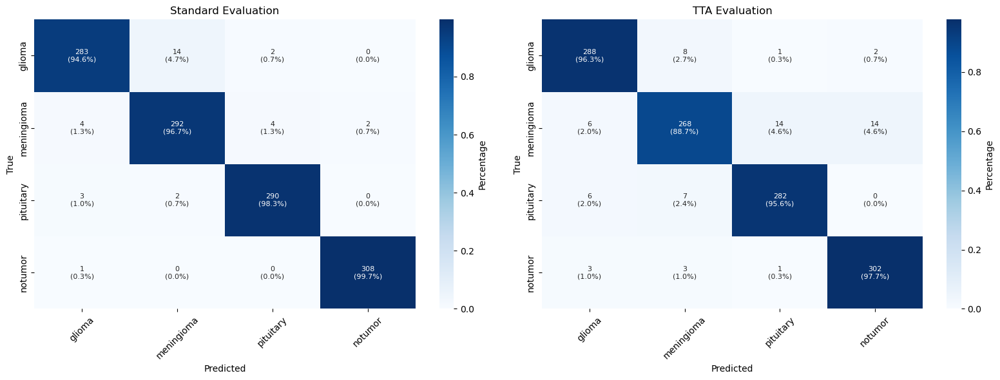


DETAILED CLASSIFICATION REPORT
              precision    recall  f1-score   support

      glioma     0.9505    0.9632    0.9568       299
  meningioma     0.9371    0.8874    0.9116       302
   pituitary     0.9463    0.9559    0.9511       295
     notumor     0.9497    0.9773    0.9633       309

    accuracy                         0.9461      1205
   macro avg     0.9459    0.9460    0.9457      1205
weighted avg     0.9459    0.9461    0.9457      1205


CLASS-WISE PERFORMANCE SUMMARY
Class                Precision  Recall     F1-Score   Support   
------------------------------------------------------------
glioma               0.9505     0.9632     0.9568     299       
meningioma           0.9371     0.8874     0.9116     302       
pituitary            0.9463     0.9559     0.9511     295       
notumor              0.9497     0.9773     0.9633     309       

PERFORMANCE COMPARISON (Standard vs TTA)
Metric       Standard   TTA        Difference
------------ ---------- ---

In [11]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Helper: Plot confusion matrix in a subplot
def plot_cm_subplot(ax, cm, labels, title):
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    annotations = np.empty_like(cm).astype(str)

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            count = cm[i, j]
            percent = cm_normalized[i, j] * 100
            annotations[i, j] = f"{count}\n({percent:.1f}%)"

    sns.heatmap(
        cm_normalized,
        annot=annotations,
        fmt='',
        cmap='Blues',
        ax=ax,
        xticklabels=[label[:12] for label in labels],
        yticklabels=[label[:12] for label in labels],
        cbar_kws={'label': 'Percentage'},
        annot_kws={"size": 8}
    )
    ax.set_title(title, fontsize=12)
    ax.set_xlabel('Predicted', fontsize=10)
    ax.set_ylabel('True', fontsize=10)
    ax.tick_params(axis='x', rotation=45)

# ===============================================
# 1. Standard Evaluation
# ===============================================
print("\n" + "="*50)
print("STANDARD EVALUATION (NO TEST-TIME AUGMENTATION)")
print("="*50)

test_loss, test_accuracy, test_precision, test_recall, test_auc = my_model.evaluate(
    X_test, Y_test, verbose=0
)

print(f"\nTest Loss     : {test_loss:.4f}")
print(f"Test Accuracy : {test_accuracy*100:.2f}%")
print(f"Test Precision: {test_precision:.4f}")
print(f"Test Recall   : {test_recall:.4f}")
print(f"Test AUC      : {test_auc:.4f}")
print("-"*50)

# Predictions
y_pred_std = np.argmax(my_model.predict(X_test, verbose=0), axis=1)
y_true = np.argmax(Y_test, axis=1)
cm_std = confusion_matrix(y_true, y_pred_std)

# ===============================================
# 2. TTA Evaluation
# ===============================================
print("\n" + "="*50)
print("TEST-TIME AUGMENTATION (TTA) EVALUATION")
print("="*50)

def predict_with_tta_batched(model, X, batch_size=32, n=5):
    y_pred_tta = []
    num_batches = int(np.ceil(len(X) / batch_size))

    for batch_idx in range(num_batches):
        start_idx = batch_idx * batch_size
        end_idx = min((batch_idx + 1) * batch_size, len(X))
        batch = X[start_idx:end_idx]

        batch_predictions = []
        for _ in range(n):
            aug = tf.image.random_flip_left_right(batch)
            aug = tf.image.random_flip_up_down(aug)
            aug = tf.image.rot90(aug, k=np.random.randint(0, 4))
            pred = model.predict(aug, verbose=0)
            batch_predictions.append(pred)

        batch_avg = np.mean(batch_predictions, axis=0)
        y_pred_tta.append(batch_avg)

    return np.concatenate(y_pred_tta, axis=0)

print("\nEvaluating with Batched Test-Time Augmentation...")
y_pred_tta = predict_with_tta_batched(my_model, X_test, batch_size=32, n=5)
y_pred_classes = np.argmax(y_pred_tta, axis=1)

# TTA metrics
accuracy = accuracy_score(y_true, y_pred_classes)
precision = precision_score(y_true, y_pred_classes, average='weighted')
recall = recall_score(y_true, y_pred_classes, average='weighted')
f1 = f1_score(y_true, y_pred_classes, average='weighted')

print(f"\nTTA Performance:")
print(f"Accuracy : {accuracy:.4f} ({accuracy*100:.2f}%)")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1-Score : {f1:.4f}")
print("-"*50)

# Confusion Matrix (TTA)
cm_tta = confusion_matrix(y_true, y_pred_classes)

# ===============================================
# Side-by-Side Confusion Matrices
# ===============================================
fig, axs = plt.subplots(1, 2, figsize=(16, 6))
plot_cm_subplot(axs[0], cm_std, LABELS, title='Standard Evaluation')
plot_cm_subplot(axs[1], cm_tta, LABELS, title='TTA Evaluation')
plt.tight_layout()
plt.show()

# ===============================================
# 3. Classification Report
# ===============================================
print("\n" + "="*50)
print("DETAILED CLASSIFICATION REPORT")
print("="*50)
print(classification_report(y_true, y_pred_classes, target_names=LABELS, digits=4))

# ===============================================
# 4. Class-wise Performance Breakdown
# ===============================================
print("\n" + "="*50)
print("CLASS-WISE PERFORMANCE SUMMARY")
print("="*50)

precision_per_class = precision_score(y_true, y_pred_classes, average=None)
recall_per_class = recall_score(y_true, y_pred_classes, average=None)
f1_per_class = f1_score(y_true, y_pred_classes, average=None)

print(f"{'Class':<20} {'Precision':<10} {'Recall':<10} {'F1-Score':<10} {'Support':<10}")
print("-" * 60)
for i, label in enumerate(LABELS):
    support = np.sum(y_true == i)
    print(f"{label:<20} {precision_per_class[i]:<10.4f} {recall_per_class[i]:<10.4f} {f1_per_class[i]:<10.4f} {support:<10}")

# ===============================================
# 5. Performance Comparison
# ===============================================
print("\n" + "="*50)
print("PERFORMANCE COMPARISON (Standard vs TTA)")
print("="*50)
print(f"{'Metric':<12} {'Standard':<10} {'TTA':<10} {'Difference':<10}")
print(f"{'-'*12} {'-'*10} {'-'*10} {'-'*10}")
print(f"{'Accuracy':<12} {test_accuracy:.4f}    {accuracy:.4f}    {accuracy - test_accuracy:+.4f}")
print(f"{'Precision':<12} {test_precision:.4f}    {precision:.4f}    {precision - test_precision:+.4f}")
print(f"{'Recall':<12} {test_recall:.4f}    {recall:.4f}    {recall - test_recall:+.4f}")

# ===============================================
# 6. Error Analysis
# ===============================================
print("\n" + "="*50)
print("TOP ERROR ANALYSIS")
print("="*50)

for i, label in enumerate(LABELS):
    misclassified = np.where((y_pred_classes != y_true) & (y_true == i))[0]
    if len(misclassified) > 0:
        wrong_preds = y_pred_classes[misclassified]
        top_error = np.bincount(wrong_preds).argmax()
        error_count = np.sum(wrong_preds == top_error)
        print(f"{label} -> {LABELS[top_error]}: {error_count}/{len(misclassified)} errors")



PHASE 1: INITIAL TRAINING METRICS


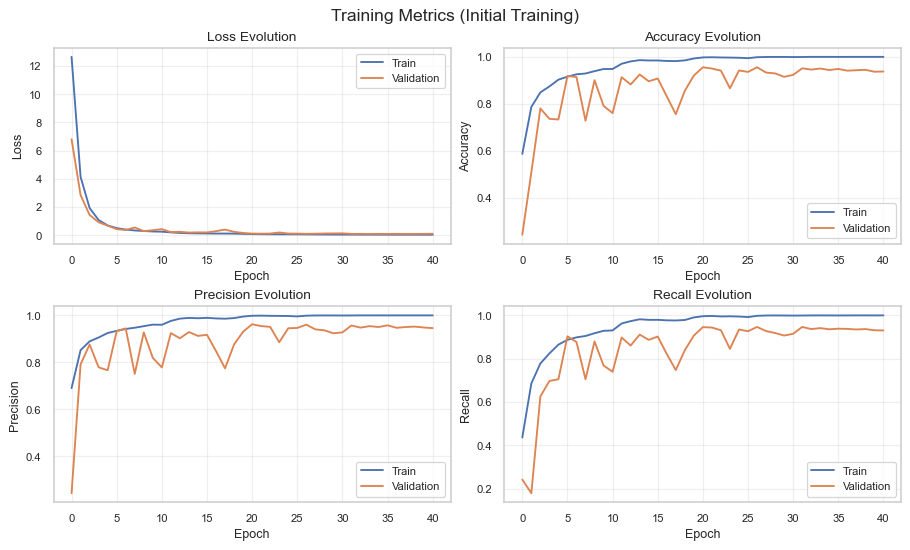


PHASE 2: FINE-TUNING METRICS


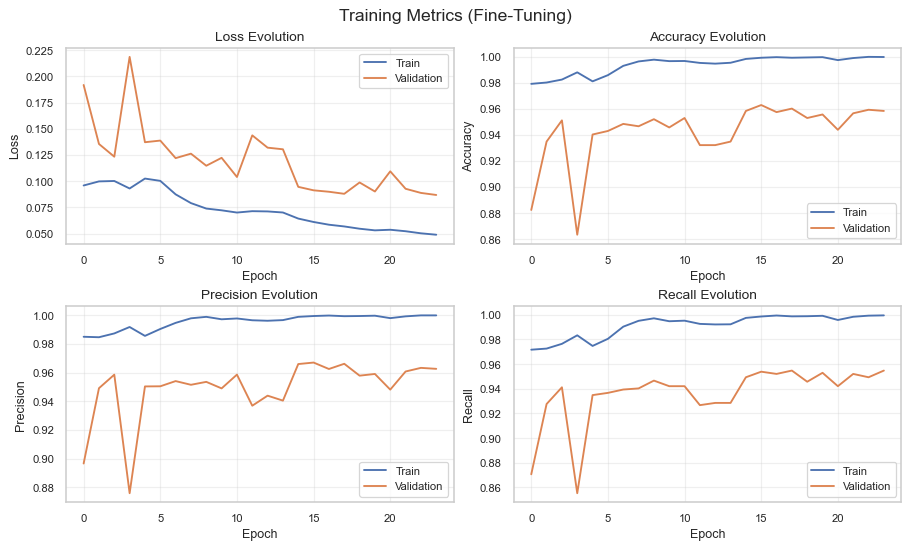

In [12]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.metrics import (
    confusion_matrix, classification_report, 
    accuracy_score, precision_score, recall_score, 
    f1_score, precision_recall_fscore_support,
    roc_curve, auc, precision_recall_curve
)
from sklearn.preprocessing import label_binarize

# Global styling
sns.set(style='whitegrid', font_scale=1.05)
plt.rcParams.update({
    'figure.dpi': 90,
    'axes.titlesize': 11,
    'axes.labelsize': 10,
    'legend.fontsize': 9,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9
})

# ==============================================================================
# 1. TRAINING HISTORY VISUALIZATION
# ==============================================================================
def plot_training_history(history, title_suffix=""):
    """Compact training curve display."""
    fig, axs = plt.subplots(2, 2, figsize=(10, 6), constrained_layout=True)
    fig.suptitle(f'Training Metrics {title_suffix}', fontsize=14)

    metrics = {
        'Loss': ('loss', 'val_loss'),
        'Accuracy': ('accuracy', 'val_accuracy'),
        'Precision': ('precision', 'val_precision'),
        'Recall': ('recall', 'val_recall')
    }

    for ax, (title, (train_key, val_key)) in zip(axs.flat, metrics.items()):
        ax.plot(history.history.get(train_key, []), label='Train', lw=1.5)
        ax.plot(history.history.get(val_key, []), label='Validation', lw=1.5)
        ax.set_title(f'{title} Evolution')
        ax.set_xlabel('Epoch')
        ax.set_ylabel(title)
        ax.grid(True, alpha=0.3)
        ax.legend()

    return fig

# ==============================================================================
# 2. DISPLAY TRAINING HISTORY
# ==============================================================================
print("\n" + "="*60)
print("PHASE 1: INITIAL TRAINING METRICS")
print("="*60)
plot_training_history(history, "(Initial Training)")
plt.show()

print("\n" + "="*60)
print("PHASE 2: FINE-TUNING METRICS")
print("="*60)
plot_training_history(history_fine, "(Fine-Tuning)")
plt.show()

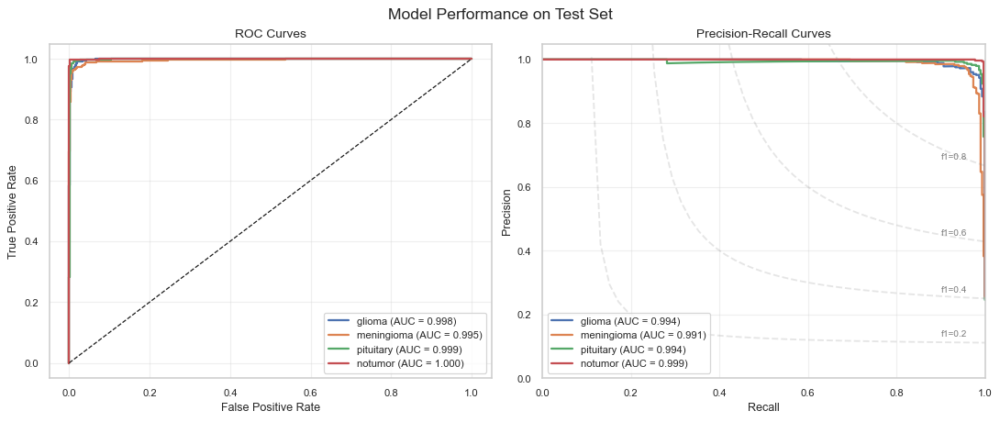

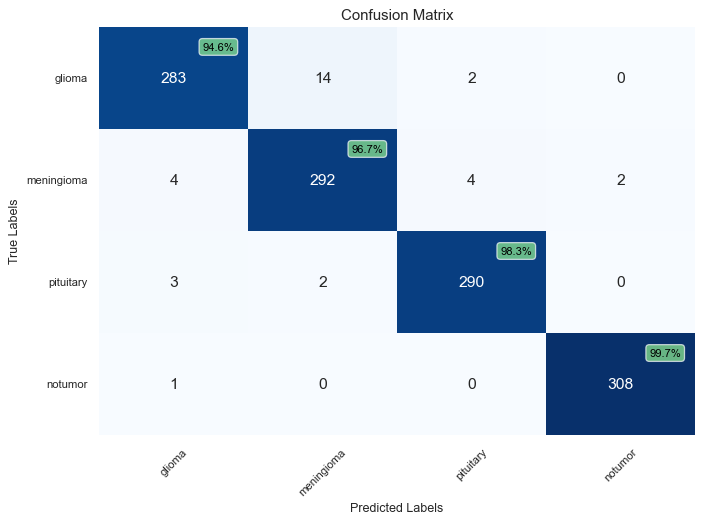


DETAILED CLASSIFICATION REPORT
              precision    recall  f1-score   support

      glioma       0.97      0.95      0.96       299
  meningioma       0.95      0.97      0.96       302
   pituitary       0.98      0.98      0.98       295
     notumor       0.99      1.00      1.00       309

    accuracy                           0.97      1205
   macro avg       0.97      0.97      0.97      1205
weighted avg       0.97      0.97      0.97      1205


TOP MISCLASSIFICATION PATTERNS
glioma -> meningioma: 14 errors
meningioma -> glioma: 4 errors
meningioma -> pituitary: 4 errors
pituitary -> glioma: 3 errors
glioma -> pituitary: 2 errors


In [13]:
# First, compute predictions and true labels
y_pred = my_model.predict(X_test, verbose=0)
y_true = np.argmax(Y_test, axis=1)  # Convert one-hot to class indices

# Now proceed with the visualization code
n_classes = len(LABELS)
y_test_bin = label_binarize(y_true, classes=range(n_classes))

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

# ROC Curve
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_pred[:, i])
    roc_auc = auc(fpr, tpr)
    axs[0].plot(fpr, tpr, lw=1.8, label=f'{LABELS[i]} (AUC = {roc_auc:.3f})')

axs[0].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0].set_title('ROC Curves')
axs[0].set_xlabel('False Positive Rate')
axs[0].set_ylabel('True Positive Rate')
axs[0].legend(loc='lower right')
axs[0].grid(alpha=0.3)

# PR Curve
for i in range(n_classes):
    precision_curve, recall_curve, _ = precision_recall_curve(y_test_bin[:, i], y_pred[:, i])
    pr_auc = auc(recall_curve, precision_curve)
    axs[1].plot(recall_curve, precision_curve, lw=1.8, label=f'{LABELS[i]} (AUC = {pr_auc:.3f})')

# Add iso-f1 curves
f_scores = np.linspace(0.2, 0.8, num=4)
for f_score in f_scores:
    x = np.linspace(0.01, 1)
    y = f_score * x / (2 * x - f_score)
    axs[1].plot(x[y >= 0], y[y >= 0], color='gray', alpha=0.2, linestyle='--')
    axs[1].annotate(f"f1={f_score:.1f}", xy=(0.9, y[-1] + 0.02), fontsize=8, alpha=0.6)

axs[1].set_title('Precision-Recall Curves')
axs[1].set_xlabel('Recall')
axs[1].set_ylabel('Precision')
axs[1].legend(loc='lower left')
axs[1].set_ylim([0.0, 1.05])
axs[1].set_xlim([0.0, 1.0])
axs[1].grid(alpha=0.3)

plt.suptitle('Model Performance on Test Set', fontsize=14)
plt.show()

# ==============================================================================
# 4. CONFUSION MATRIX VISUALIZATION
# ==============================================================================
y_pred_classes = np.argmax(y_pred, axis=1)
cm = confusion_matrix(y_true, y_pred_classes)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=LABELS, 
            yticklabels=LABELS,
            cbar=False)

plt.title('Confusion Matrix', fontsize=12)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.xticks(rotation=45)
plt.yticks(rotation=0)

# Add accuracy annotations
for i in range(len(LABELS)):
    accuracy = cm[i,i] / cm[i].sum()
    plt.text(i+0.8, i+0.2, f'{accuracy:.1%}', 
             ha='center', va='center', 
             color='black' if accuracy > 0.5 else 'white',
             fontsize=9,
             bbox=dict(boxstyle='round,pad=0.3', 
                       facecolor=('white' if accuracy < 0.7 else 'lightgreen'), 
                       alpha=0.7))

plt.tight_layout()
plt.show()

# ==============================================================================
# 5. CLASSIFICATION REPORT
# ==============================================================================
print("\n" + "="*60)
print("DETAILED CLASSIFICATION REPORT")
print("="*60)
print(classification_report(y_true, y_pred_classes, target_names=LABELS))

# ==============================================================================
# 6. ERROR ANALYSIS - TOP MISCLASSIFICATIONS
# ==============================================================================
error_indices = np.where(y_true != y_pred_classes)[0]
error_samples = []
for idx in error_indices:
    true_label = LABELS[y_true[idx]]
    pred_label = LABELS[y_pred_classes[idx]]
    error_samples.append((true_label, pred_label, idx))

error_counts = {}
for true, pred, _ in error_samples:
    key = f"{true} -> {pred}"
    error_counts[key] = error_counts.get(key, 0) + 1

# Sort by frequency
sorted_errors = sorted(error_counts.items(), key=lambda x: x[1], reverse=True)[:5]

print("\n" + "="*60)
print("TOP MISCLASSIFICATION PATTERNS")
print("="*60)
for pattern, count in sorted_errors:
    print(f"{pattern}: {count} errors")

In [14]:
from sklearn.metrics import confusion_matrix

# After predicting classes
y_pred_classes = np.argmax(y_pred, axis=1)
cm = confusion_matrix(y_true, y_pred_classes)  # ← cm must be the array, not the module
for i, label in enumerate(LABELS):
    TP = cm[i, i]
    FN = cm[i, :].sum() - TP
    FP = cm[:, i].sum() - TP
    TN = cm.sum() - (TP + FP + FN)
    
    sensitivity = TP / (TP + FN) if (TP + FN) > 0 else 0
    specificity = TN / (TN + FP) if (TN + FP) > 0 else 0
    
    print(f"{label}: Sensitivity (Recall) = {sensitivity:.3f}, Specificity = {specificity:.3f}")


glioma: Sensitivity (Recall) = 0.946, Specificity = 0.991
meningioma: Sensitivity (Recall) = 0.967, Specificity = 0.982
pituitary: Sensitivity (Recall) = 0.983, Specificity = 0.993
notumor: Sensitivity (Recall) = 0.997, Specificity = 0.998


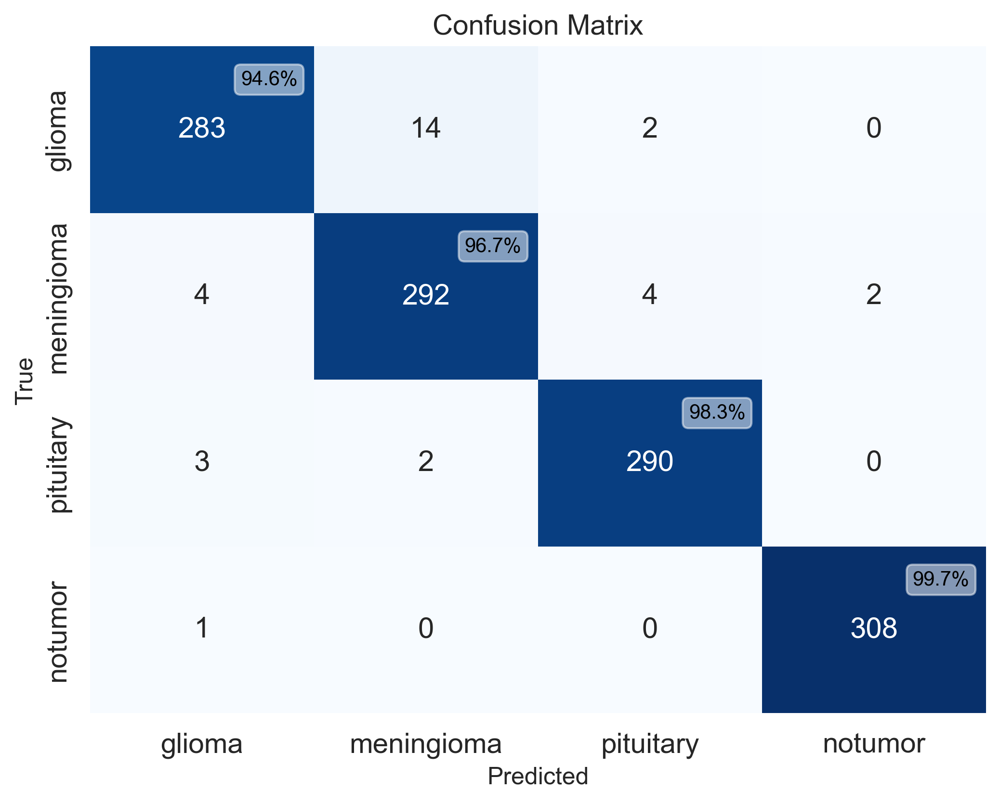

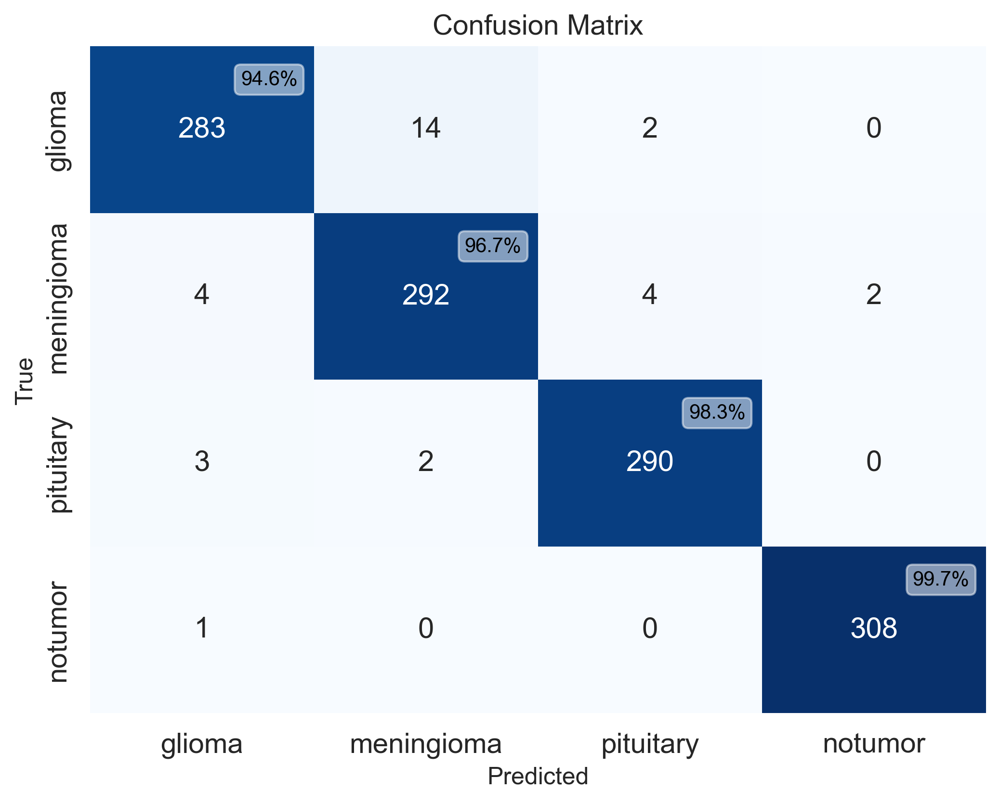

In [21]:
# ---------- 3. CONFUSION MATRIX ----------
def plot_confusion_matrix(y_true, y_pred_classes, labels, save_path=None):
    cm = confusion_matrix(y_true, y_pred_classes)
    fig, ax = plt.subplots(figsize=(8, 6))
    
    # Increase tick label size
    sns.heatmap(
        cm, annot=True, fmt='d', cmap='Blues',
        xticklabels=labels, yticklabels=labels,
        cbar=False, ax=ax
    )
    
    # Make axis tick labels bigger
    ax.set_xticklabels(labels, fontsize=14)  # Increased font size
    ax.set_yticklabels(labels, fontsize=14)  # Increased font size
    
    ax.set_xlabel('Predicted', fontsize=12)
    ax.set_ylabel('True', fontsize=12)
    ax.set_title('Confusion Matrix', fontsize=14)

    # Annotate accuracy per class
    for i in range(len(labels)):
        acc = cm[i,i] / cm[i].sum()
        ax.text(
            i + 0.8, i + 0.2, f'{acc:.1%}', ha='center', va='center',
            color='black' if acc > 0.5 else 'white', fontsize=10,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.5)
        )
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    return fig

y_pred_classes = np.argmax(y_pred, axis=1)
plot_confusion_matrix(y_true, y_pred_classes, LABELS, save_path="cmfigbigxx.png")


C:\Users\Shafi.09\AppData\Local\Temp\ipykernel_32120\840457864.py:79: RuntimeWarning: divide by zero encountered in divide
  y = f_score * x / (2 * x - f_score)
C:\Users\Shafi.09\AppData\Local\Temp\ipykernel_32120\840457864.py:93: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  plt.savefig(save_path, dpi=300, bbox_inches='tight')


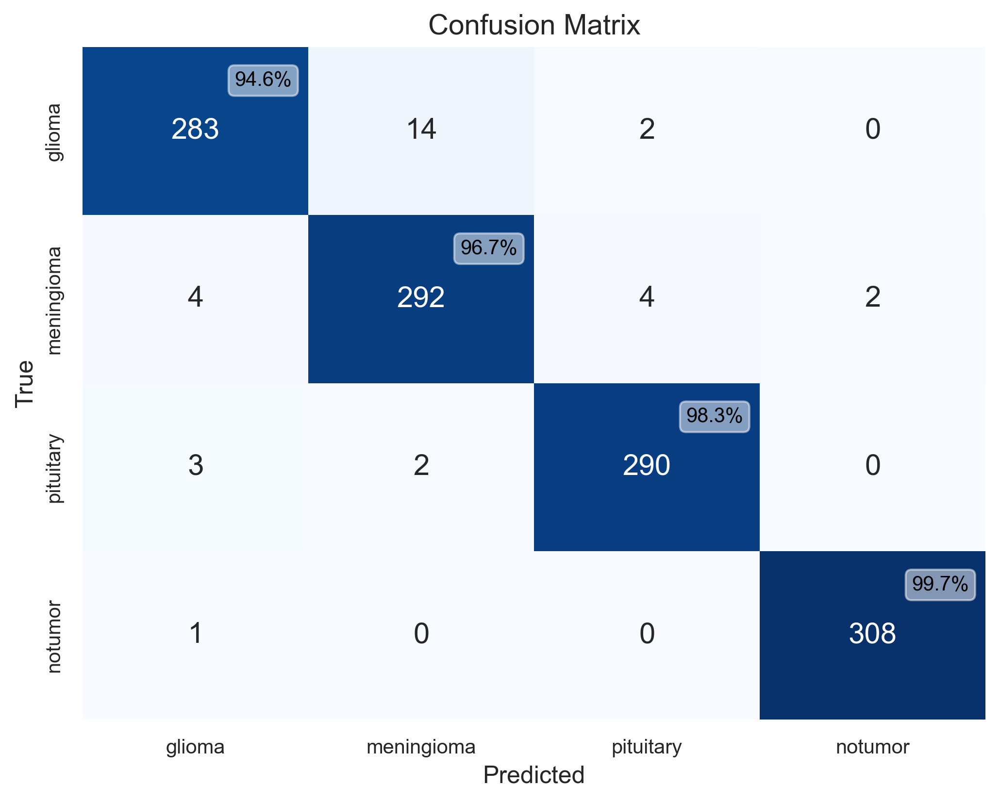

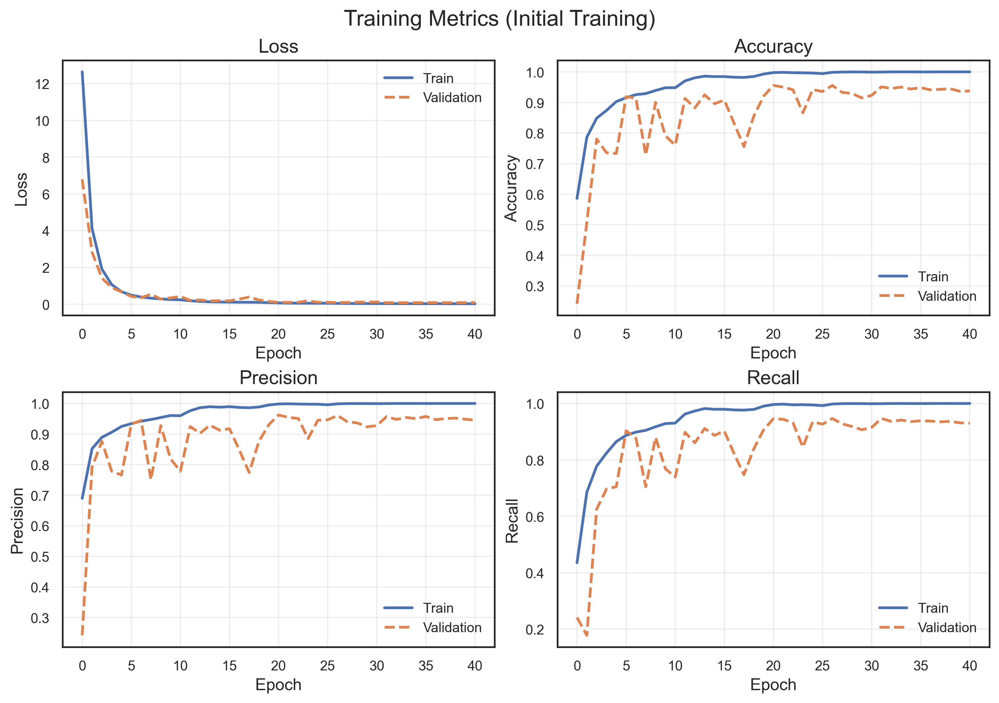

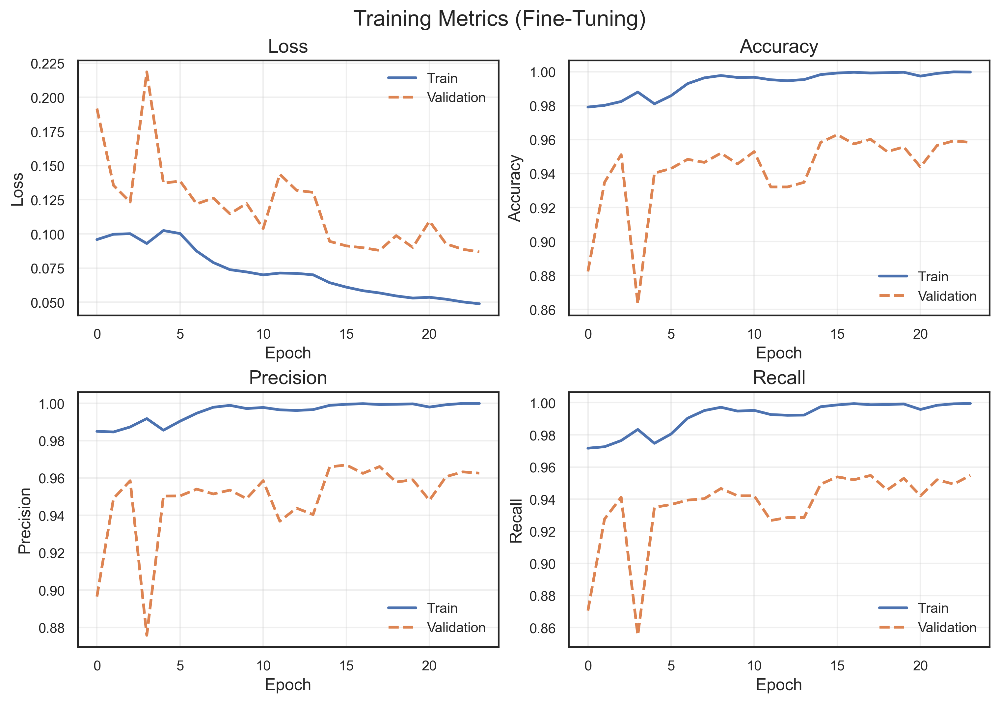

C:\Users\Shafi.09\anaconda3\envs\tensorflow\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


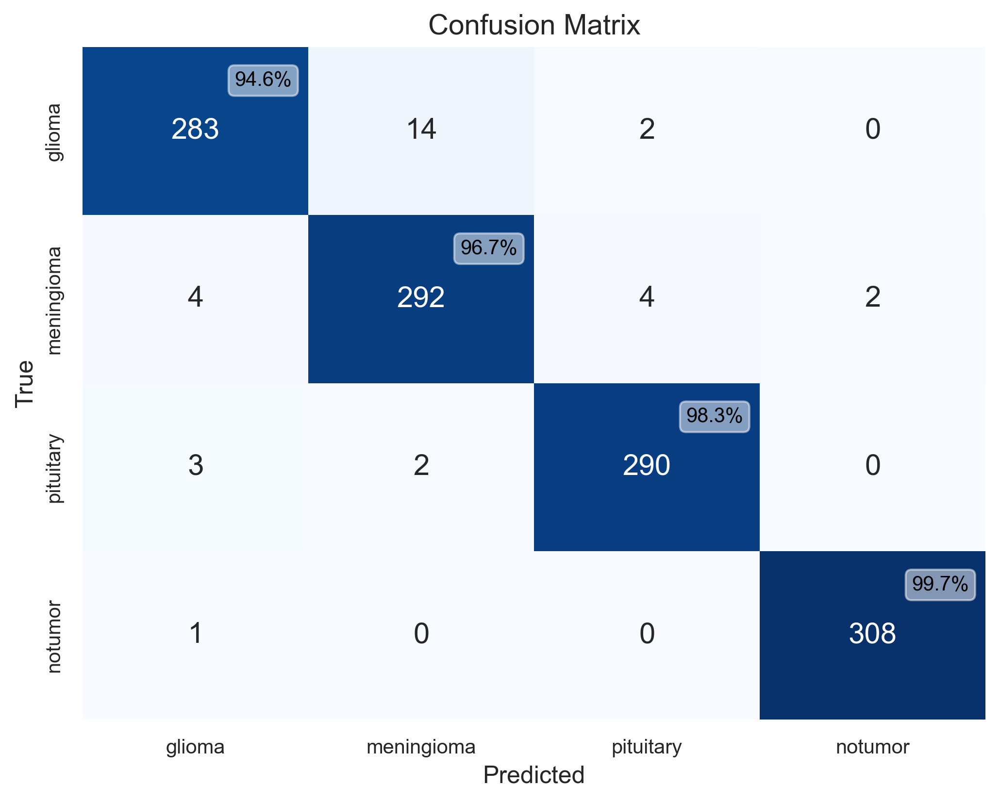

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    confusion_matrix, classification_report,
    roc_curve, auc, precision_recall_curve
)
from sklearn.preprocessing import label_binarize

# ---------- GLOBAL STYLE ----------
sns.set(style='white', font_scale=1.2)
plt.rcParams.update({
    'figure.dpi': 300,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'legend.fontsize': 10,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
})

# ---------- 1. TRAINING HISTORY ----------
def plot_training_history(history, title_suffix="", save_path=None):
    metrics = {
        'Loss': ('loss', 'val_loss'),
        'Accuracy': ('accuracy', 'val_accuracy'),
        'Precision': ('precision', 'val_precision'),
        'Recall': ('recall', 'val_recall')
    }

    fig, axs = plt.subplots(2, 2, figsize=(10, 7), constrained_layout=True)
    fig.suptitle(f'Training Metrics {title_suffix}', fontsize=16)

    for ax, (title, (train_key, val_key)) in zip(axs.flat, metrics.items()):
        ax.plot(history.history.get(train_key, []), label='Train', lw=2)
        ax.plot(history.history.get(val_key, []), label='Validation', lw=2, linestyle='--')
        ax.set_title(title)
        ax.set_xlabel('Epoch')
        ax.set_ylabel(title)
        ax.grid(alpha=0.3)
        ax.legend(loc='best', frameon=False)

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    return fig

# Example usage:
plot_training_history(history, "(Initial Training)", save_path="training_initial.png")
plot_training_history(history_fine, "(Fine-Tuning)", save_path="training_finetune.png")

# ---------- 2. ROC & PR CURVES ----------
def plot_roc_pr(y_true, y_pred, labels, save_path=None):
    n_classes = len(labels)
    y_true_bin = label_binarize(y_true, classes=range(n_classes))

    fig, axs = plt.subplots(1, 2, figsize=(12, 5), constrained_layout=True)

    # ROC Curve
    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred[:, i])
        roc_auc = auc(fpr, tpr)
        axs[0].plot(fpr, tpr, lw=2, label=f'{labels[i]} (AUC={roc_auc:.3f})')
    axs[0].plot([0, 1], [0, 1], 'k--', lw=1)
    axs[0].set_title('ROC Curves')
    axs[0].set_xlabel('False Positive Rate')
    axs[0].set_ylabel('True Positive Rate')
    axs[0].grid(alpha=0.2)
    axs[0].legend(loc='lower right')

    # PR Curve
    for i in range(n_classes):
        precision, recall, _ = precision_recall_curve(y_true_bin[:, i], y_pred[:, i])
        pr_auc = auc(recall, precision)
        axs[1].plot(recall, precision, lw=2, label=f'{labels[i]} (AUC={pr_auc:.3f})')

    # Iso-F1 curves
    f_scores = np.linspace(0.2, 0.8, 4)
    for f_score in f_scores:
        x = np.linspace(0.01, 1, 100)
        y = f_score * x / (2 * x - f_score)
        y[y > 1] = np.nan
        axs[1].plot(x, y, color='gray', alpha=0.3, linestyle='--')
        axs[1].text(0.9, min(y[np.isfinite(y)]), f'f1={f_score:.1f}', fontsize=9, alpha=0.6)

    axs[1].set_title('Precision-Recall Curves')
    axs[1].set_xlabel('Recall')
    axs[1].set_ylabel('Precision')
    axs[1].set_xlim([0.0, 1.0])
    axs[1].set_ylim([0.0, 1.05])
    axs[1].grid(alpha=0.2)
    axs[1].legend(loc='lower left')

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    return fig

plot_roc_pr(y_true, y_pred, LABELS, save_path="roc_pr_curves.png")

# ---------- 3. CONFUSION MATRIX ----------
def plot_confusion_matrix(y_true, y_pred_classes, labels, save_path=None):
    cm = confusion_matrix(y_true, y_pred_classes)
    fig, ax = plt.subplots(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels, cbar=False, ax=ax)
    ax.set_xlabel('Predicted')
    ax.set_ylabel('True')
    ax.set_title('Confusion Matrix')

    # Annotate accuracy per class
    for i in range(len(labels)):
        acc = cm[i,i] / cm[i].sum()
        ax.text(i+0.8, i+0.2, f'{acc:.1%}', ha='center', va='center',
                color='black' if acc > 0.5 else 'white', fontsize=10,
                bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.5))
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    return fig

y_pred_classes = np.argmax(y_pred, axis=1)
plot_confusion_matrix(y_true, y_pred_classes, LABELS, save_path="confusion_matrix.png")


(<Figure size 2100x2100 with 1 Axes>, <Figure size 2100x2100 with 1 Axes>)

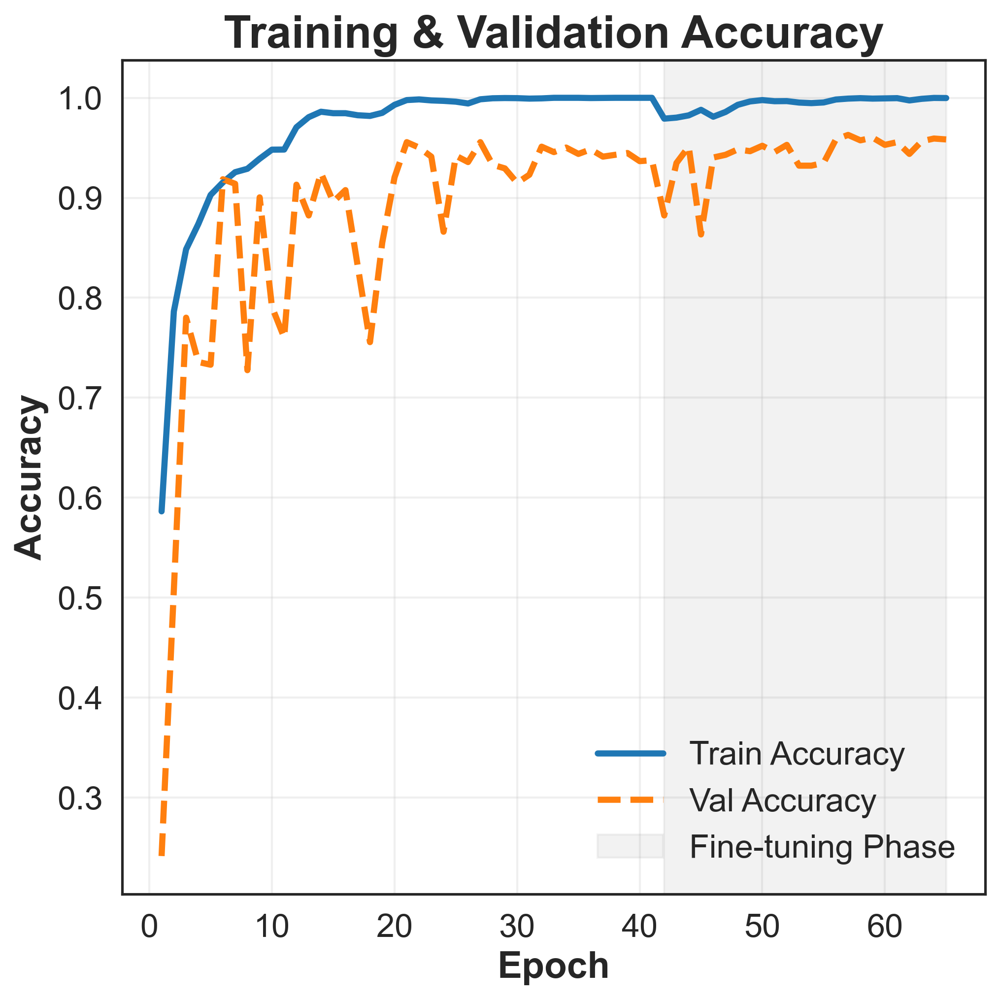

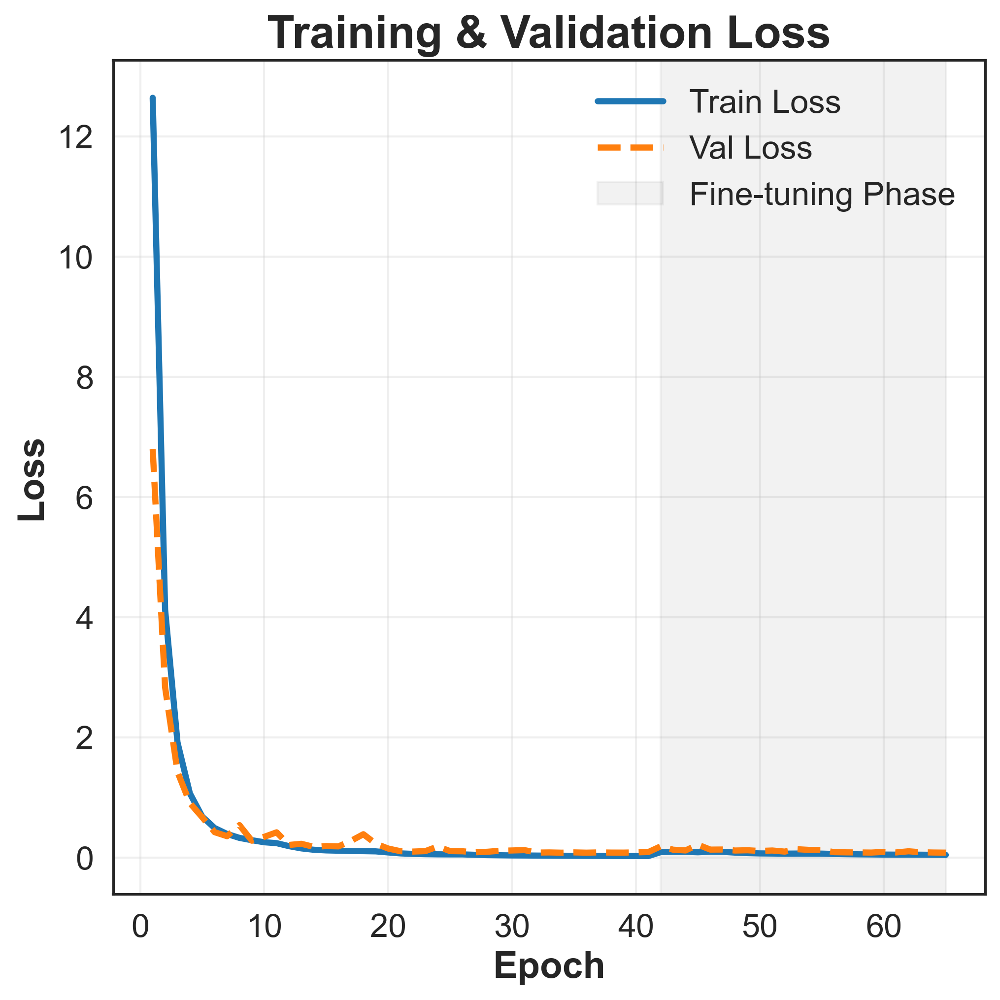

In [30]:
# ---------- COMBINED (SEAMLESS INITIAL + FINE-TUNING, WITH SHADED REGION, BIGGER TEXT) ----------
def plot_acc_loss_stitched(history_init, history_fine, save_prefix=None):
    """
    Plot stitched Accuracy and Loss curves (Initial + Fine-tuning combined).
    Adds shaded region for fine-tuning.
    Produces 2 publication-quality square figures: Accuracy and Loss, with very large readable text.
    """
    # Merge history
    acc = history_init.history["accuracy"] + history_fine.history["accuracy"]
    val_acc = history_init.history["val_accuracy"] + history_fine.history["val_accuracy"]
    loss = history_init.history["loss"] + history_fine.history["loss"]
    val_loss = history_init.history["val_loss"] + history_fine.history["val_loss"]

    epochs = range(1, len(acc) + 1)
    ft_start = len(history_init.history["accuracy"]) + 1  # where fine-tuning begins

    # --- Accuracy ---
    fig_acc, ax = plt.subplots(figsize=(7, 7), dpi=300)  # bigger square
    ax.plot(epochs, acc, "-", color="tab:blue", label="Train Accuracy", lw=3)
    ax.plot(epochs, val_acc, "--", color="tab:orange", label="Val Accuracy", lw=3)

    # Shade fine-tuning region
    ax.axvspan(ft_start, len(acc), color="gray", alpha=0.1, label="Fine-tuning Phase")

    ax.set_title("Training & Validation Accuracy", fontsize=22, weight="bold")
    ax.set_xlabel("Epoch", fontsize=18, weight="bold")
    ax.set_ylabel("Accuracy", fontsize=18, weight="bold")
    ax.tick_params(axis="both", labelsize=16)
    ax.grid(alpha=0.3)
    ax.legend(loc="lower right", frameon=False, fontsize=16)
    fig_acc.tight_layout()

    if save_prefix:
        plt.savefig(f"{save_prefix}_accuracy_big.png", dpi=300, bbox_inches="tight")

    # --- Loss ---
    fig_loss, ax = plt.subplots(figsize=(7, 7), dpi=300)
    ax.plot(epochs, loss, "-", color="tab:blue", label="Train Loss", lw=3)
    ax.plot(epochs, val_loss, "--", color="tab:orange", label="Val Loss", lw=3)

    # Shade fine-tuning region
    ax.axvspan(ft_start, len(acc), color="gray", alpha=0.1, label="Fine-tuning Phase")

    ax.set_title("Training & Validation Loss", fontsize=22, weight="bold")
    ax.set_xlabel("Epoch", fontsize=18, weight="bold")
    ax.set_ylabel("Loss", fontsize=18, weight="bold")
    ax.tick_params(axis="both", labelsize=16)
    ax.grid(alpha=0.3)
    ax.legend(loc="upper right", frameon=False, fontsize=16)
    fig_loss.tight_layout()

    if save_prefix:
        plt.savefig(f"{save_prefix}_loss_big.png", dpi=300, bbox_inches="tight")

    return fig_acc, fig_loss


# Example call
plot_acc_loss_stitched(history, history_fine, save_prefix="training_stitched")


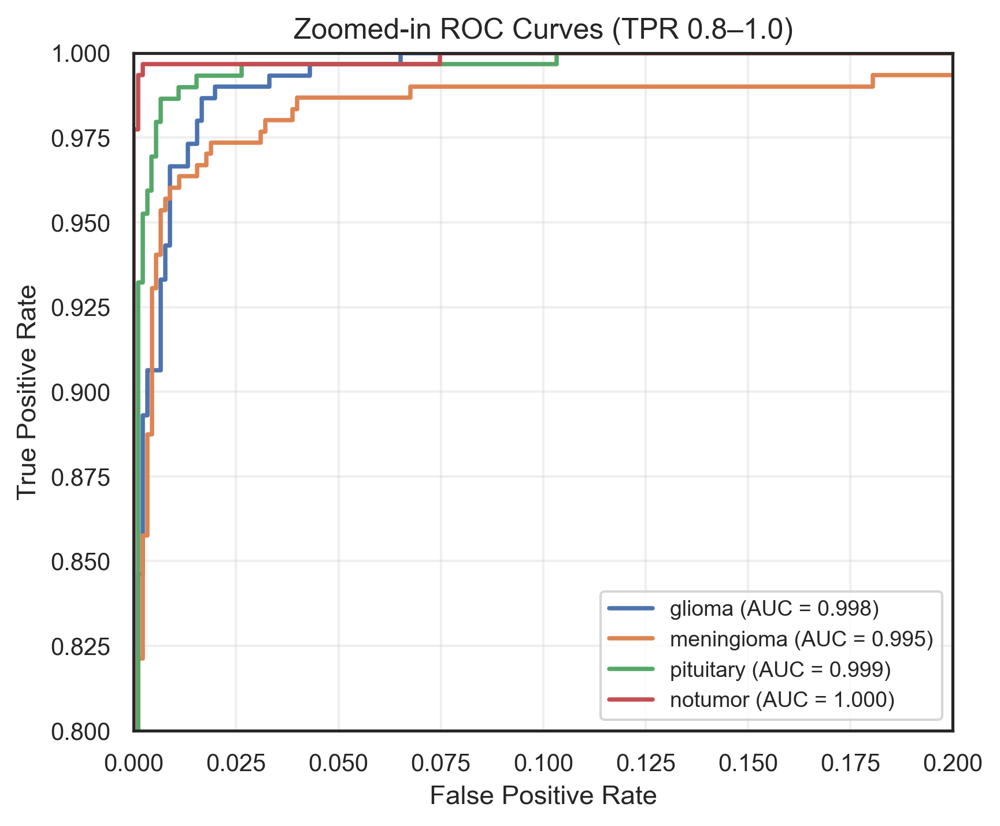

In [17]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Zoomed-in ROC Curve (FPR 0.0–0.2, TPR 0.8–1.0)
fig, ax = plt.subplots(figsize=(6, 5))

for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_pred[:, i])
    roc_auc = auc(fpr, tpr)
    ax.plot(fpr, tpr, lw=1.8, label=f'{LABELS[i]} (AUC = {roc_auc:.3f})')

ax.plot([0, 1], [0, 1], 'k--', lw=1)
ax.set_xlim([0.0, 0.2])   # Low FPR
ax.set_ylim([0.8, 1.0])   # High TPR
ax.set_title('Zoomed-in ROC Curves (TPR 0.8–1.0)', fontsize=12)
ax.set_xlabel('False Positive Rate', fontsize=11)
ax.set_ylabel('True Positive Rate', fontsize=11)
ax.legend(loc='lower right', fontsize=9)
ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig("roc_curve_zoomed_pub.png", dpi=300)  # High-res for publication
plt.show()


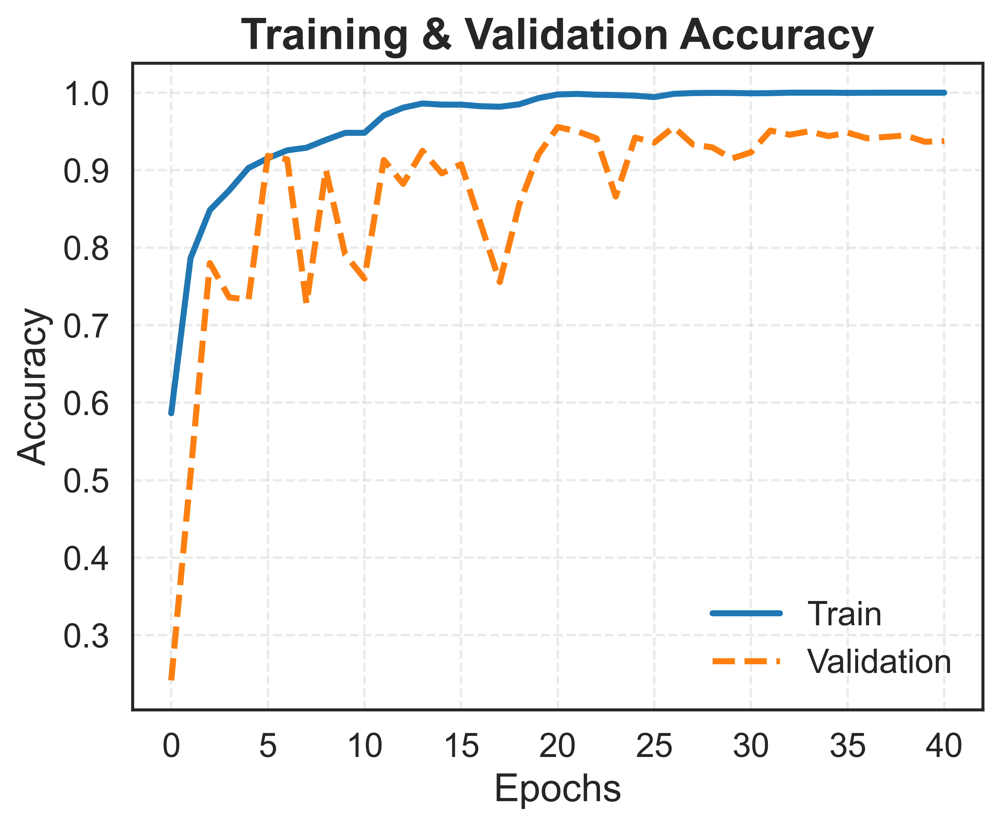

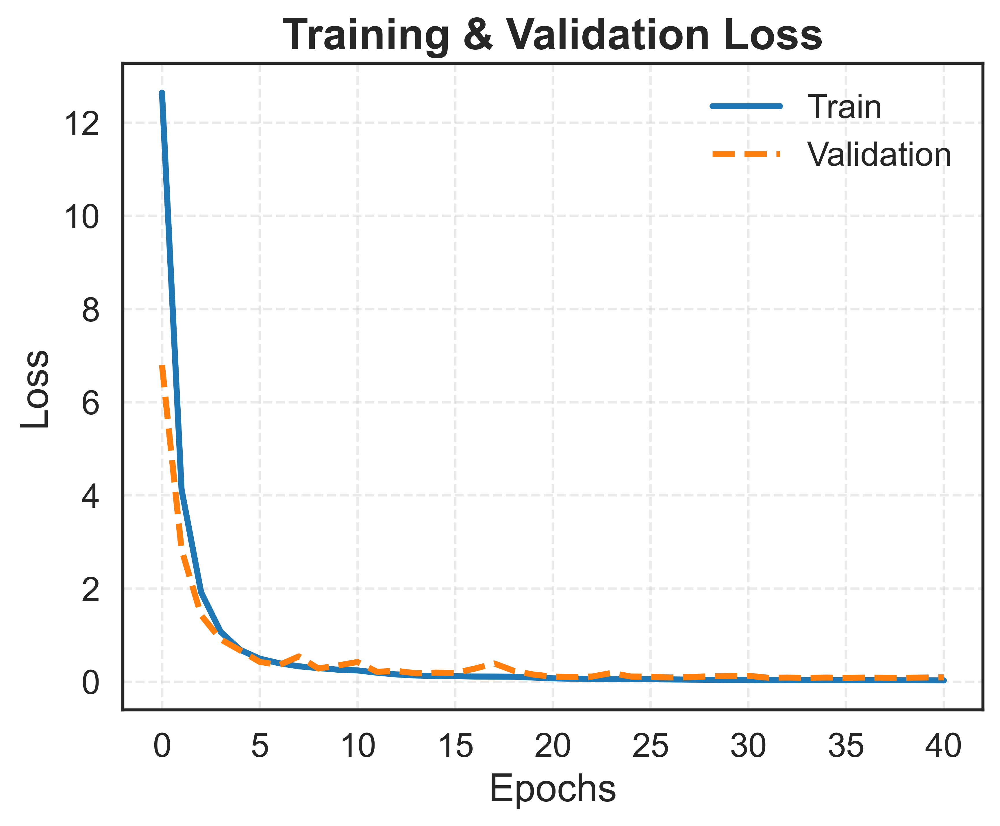

In [18]:
import matplotlib.pyplot as plt

# ---------- PUBLICATION-READY PLOTS ----------
def plot_training_metric(history, metric, val_metric, title, ylabel, save_path=None):
    plt.figure(figsize=(6, 5), dpi=600)  # High DPI for publication
    plt.plot(history.history.get(metric, []), label='Train', lw=2.5, color='tab:blue')
    plt.plot(history.history.get(val_metric, []), label='Validation', lw=2.5, linestyle='--', color='tab:orange')
    
    plt.title(title, fontsize=18, weight='bold')
    plt.xlabel('Epochs', fontsize=16)
    plt.ylabel(ylabel, fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(alpha=0.4, linestyle='--')
    plt.legend(fontsize=14, frameon=False, loc='best')
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=600, bbox_inches='tight')  # Export high-quality
    plt.show()

# ---------- EXPORT SEPARATE PLOTS ----------
# Accuracy
plot_training_metric(
    history,
    metric='accuracy',
    val_metric='val_accuracy',
    title='Training & Validation Accuracy',
    ylabel='Accuracy',
    save_path='accuracy_curve.png'
)

# Loss
plot_training_metric(
    history,
    metric='loss',
    val_metric='val_loss',
    title='Training & Validation Loss',
    ylabel='Loss',
    save_path='loss_curve.png'
)


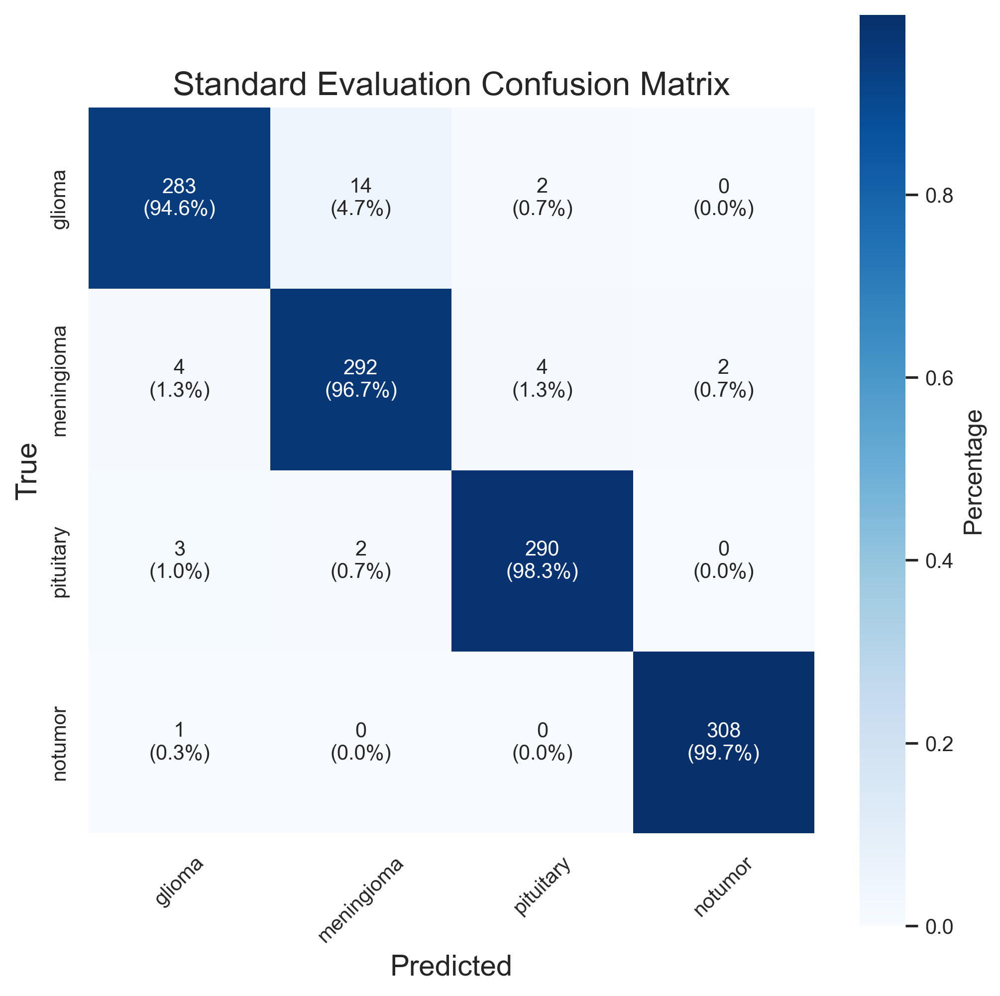

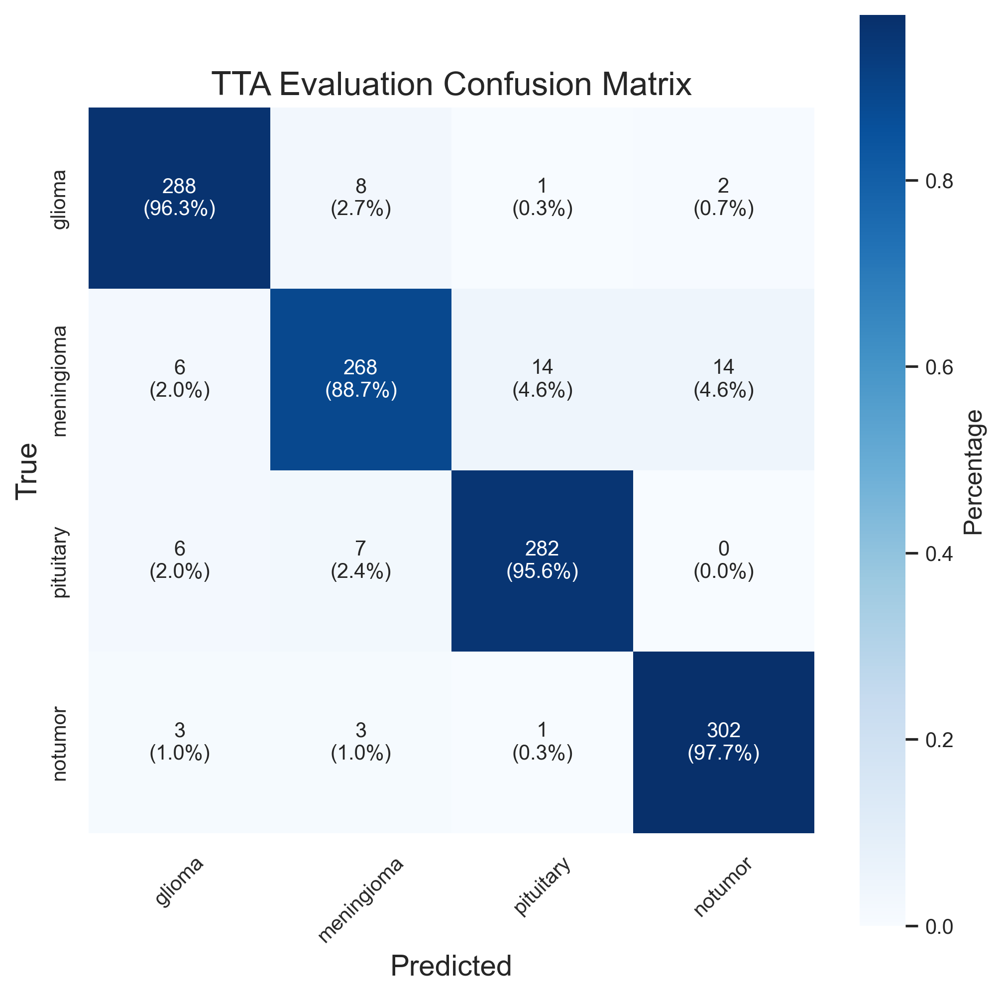

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_cm_subplot(ax, cm, labels, title):
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    annotations = np.empty_like(cm).astype(str)

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            count = cm[i, j]
            percent = cm_normalized[i, j] * 100
            annotations[i, j] = f"{count}\n({percent:.1f}%)"

    sns.heatmap(
        cm_normalized,
        annot=annotations,
        fmt='',
        cmap='Blues',
        ax=ax,
        xticklabels=[label[:12] for label in labels],
        yticklabels=[label[:12] for label in labels],
        cbar_kws={'label': 'Percentage'},
        annot_kws={"size": 10},
        square=True  # <-- keep cells square
    )
    ax.set_title(title, fontsize=16)
    ax.set_xlabel('Predicted', fontsize=14)
    ax.set_ylabel('True', fontsize=14)
    ax.tick_params(axis='x', rotation=45)

# Plot confusion matrix with square cells and reasonable size
fig, ax = plt.subplots(figsize=(7, 7))
plot_cm_subplot(ax, cm_std, LABELS, title='Standard Evaluation Confusion Matrix')
plt.tight_layout()
plt.show()

# Plot TTA confusion matrix with the same style
fig, ax = plt.subplots(figsize=(7, 7))
plot_cm_subplot(ax, cm_tta, LABELS, title='TTA Evaluation Confusion Matrix')
plt.tight_layout()
plt.show()


In [20]:
import random

def visualize_random_gradcam(model, images, true_labels, class_names, layer_name='Conv5', 
                             num_samples=20, output_dir='gradcam_publication'):
    """
    Generate publication-ready Grad-CAM visualizations for a random selection of images
    """
    print("\nGenerating publication-quality Grad-CAM visualizations for random samples...")
    
    os.makedirs(output_dir, exist_ok=True)
    
    # Randomly sample indices
    total_images = len(images)
    sample_indices = random.sample(range(total_images), min(num_samples, total_images))
    
    saved_paths = []
    for idx in sample_indices:
        img = images[idx]
        true_label = true_labels[idx]
        
        output_path = save_publication_gradcam(
            model=model,
            image=img,
            true_label=true_label,
            class_names=class_names,
            layer_name=layer_name,
            output_dir=output_dir,
            cmap='inferno',  # Publication-friendly colormap
            alpha=0.6
        )
        saved_paths.append(output_path)
    
    print(f"\n✅ Successfully generated {len(saved_paths)} publication-ready visualizations")
    print(f"Saved in directory: {os.path.abspath(output_dir)}")
    return saved_paths

# ====================
# EXECUTE RANDOM 20 IMAGE GRAD-CAM VISUALIZATION
# ====================
saved_files = visualize_random_gradcam(
    model=my_model,
    images=X_test,
    true_labels=Y_test,
    class_names=LABELS,
    layer_name='Conv5',
    num_samples=20,
    output_dir='gradcam_random_20'
)

print("\nSample saved files:")
for i, path in enumerate(saved_files[:3]):
    print(f"{i+1}. {os.path.basename(path)}")
from tensorflow.keras.utils import plot_model

# Save architecture diagram
plot_model(
    my_model, 
    to_file='model_architecture.png', 
    show_shapes=True, 
    show_layer_names=True,
    expand_nested=True,  # If you have nested models
    dpi=300
)



Generating publication-quality Grad-CAM visualizations for random samples...


NameError: name 'save_publication_gradcam' is not defined

In [ ]:
# ====================
# COLORMAP COMPARISON FOR GRAD-CAM
# ====================
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib as mpl
import os
from matplotlib.gridspec import GridSpec

# Set publication-quality plotting parameters
mpl.rcParams['figure.dpi'] = 300
mpl.rcParams['font.size'] = 10
mpl.rcParams['axes.titlepad'] = 10
mpl.rcParams['savefig.bbox'] = 'tight'

def generate_gradcam(model, image, layer_name='Conv5'):
    """Generate Grad-CAM heatmap for a single image"""
    grad_model = tf.keras.models.Model(
        inputs=model.inputs,
        outputs=[model.get_layer(layer_name).output, model.output]
    )
    
    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(np.expand_dims(image, axis=0))
        pred_index = tf.argmax(predictions[0])
        loss = predictions[:, pred_index]
    
    grads = tape.gradient(loss, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    
    conv_output = conv_output[0]
    heatmap = conv_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0)
    heatmap = heatmap / (tf.math.reduce_max(heatmap) + 1e-8)  # Normalize
    
    heatmap = tf.image.resize(
        np.expand_dims(heatmap, axis=-1), 
        (image.shape[0], image.shape[1]),
        method='bilinear'
    ).numpy().squeeze()
    
    return heatmap

def generate_colormap_comparison(model, image, true_label, class_names, 
                                 layer_name='Conv5', output_dir='gradcam_colormaps'):
    """
    Generate comparison of different colormaps for the same Grad-CAM result
    """
    os.makedirs(output_dir, exist_ok=True)
    
    # Generate heatmap once (expensive operation)
    heatmap = generate_gradcam(model, image, layer_name)
    
    # Prepare image
    if image.shape[-1] == 1:
        img_display = np.squeeze(image, axis=-1)
    else:
        img_display = image
    
    # Get prediction information
    preds = model.predict(np.expand_dims(image, axis=0), verbose=0)
    pred_class = class_names[np.argmax(preds)]
    true_class = class_names[np.argmax(true_label)]
    confidence = np.max(preds) * 100
    
    # Define colormaps to compare
    colormaps = [
        ('viridis', 'Viridis (Default)'),
        ('inferno', 'Inferno (High Contrast)'),
        ('plasma', 'Plasma (Smooth)'),
        ('magma', 'Magma (Dark Background)'),
        ('cividis', 'Cividis (Colorblind Friendly)'),
        ('jet', 'Jet (Traditional)'),
        ('coolwarm', 'Coolwarm (Diverging)'),
        ('rainbow', 'Rainbow')
    ]
    
    # Create figure
    fig = plt.figure(figsize=(15, 10))
    fig.suptitle(f"Grad-CAM Colormap Comparison: True={true_class}, Pred={pred_class} ({confidence:.1f}%)",
                 fontsize=16, fontweight='bold', y=0.98)
    
    # Create grid layout
    n_cols = 4
    n_rows = int(np.ceil(len(colormaps) / n_cols))
    gs = GridSpec(n_rows*2 + 1, n_cols, figure=fig, height_ratios=[1] + [0.5, 1]*n_rows)
    
    # Plot original image
    ax0 = fig.add_subplot(gs[0, :])
    ax0.imshow(img_display, cmap='gray')
    ax0.set_title('Original MRI Scan', fontsize=12, fontweight='bold')
    ax0.axis('off')
    
    # Plot each colormap
    for i, (cmap_name, cmap_label) in enumerate(colormaps):
        row = 1 + 2*(i // n_cols)
        col = i % n_cols
        
        # Create colormap preview
        ax_cmap = fig.add_subplot(gs[row, col])
        gradient = np.linspace(0, 1, 256)
        gradient = np.vstack((gradient, gradient))
        ax_cmap.imshow(gradient, aspect='auto', cmap=cmap_name)
        ax_cmap.set_title(cmap_label, fontsize=11)
        ax_cmap.set_xticks([])
        ax_cmap.set_yticks([])
        
        # Create Grad-CAM visualization
        ax_heat = fig.add_subplot(gs[row+1, col])
        ax_heat.imshow(img_display, cmap='gray')
        im = ax_heat.imshow(heatmap, cmap=cmap_name, alpha=0.6)
        ax_heat.set_title(f"{cmap_name} overlay", fontsize=10)
        ax_heat.axis('off')
    
    plt.tight_layout()
    
    # Save comparison
    output_path = os.path.join(output_dir, f"colormap_comparison_{true_class}_{pred_class}.png")
    plt.savefig(output_path, dpi=600, bbox_inches='tight')
    plt.close()
    
    return output_path

def visualize_gradcam_results(model, images, true_labels, class_names, layer_name='Conv5', 
                             num_samples=3, output_dir='gradcam_publication'):
    """
    Generate publication-ready Grad-CAM visualizations with colormap comparisons
    """
    print("\nGenerating publication-quality Grad-CAM visualizations...")
    
    # Create output directories
    main_dir = os.path.join(output_dir, "main_results")
    comparison_dir = os.path.join(output_dir, "colormap_comparisons")
    os.makedirs(main_dir, exist_ok=True)
    os.makedirs(comparison_dir, exist_ok=True)
    
    # Process samples
    for class_idx, class_name in enumerate(class_names):
        class_indices = np.where(np.argmax(true_labels, axis=1) == class_idx)[0]
        
        if len(class_indices) == 0:
            continue
            
        sample_indices = np.random.choice(
            class_indices, 
            min(num_samples, len(class_indices)), 
            replace=False
        )
        
        for i, idx in enumerate(sample_indices):
            img = images[idx]
            true_label = true_labels[idx]
            
            print(f"Processing sample {i+1}/{len(sample_indices)} for class {class_name}")
            
            # Generate colormap comparison
            comparison_path = generate_colormap_comparison(
                model=model,
                image=img,
                true_label=true_label,
                class_names=class_names,
                layer_name=layer_name,
                output_dir=comparison_dir
            )
            
            # Generate individual visualizations with best colormaps
            for cmap in ['inferno', 'viridis', 'plasma']:
                save_publication_gradcam(
                    model=model,
                    image=img,
                    true_label=true_label,
                    class_names=class_names,
                    layer_name=layer_name,
                    output_dir=os.path.join(main_dir, cmap),
                    cmap=cmap,
                    alpha=0.6
                )
    
    print(f"\n✅ Successfully generated visualizations")
    print(f"Main results saved in: {os.path.abspath(main_dir)}")
    print(f"Colormap comparisons saved in: {os.path.abspath(comparison_dir)}")
    
    return main_dir, comparison_dir

# ====================
# EXECUTE VISUALIZATION
# ====================
print("\n" + "="*70)
print("GENERATING GRAD-CAM WITH COLORMAP COMPARISONS")
print("="*70)

# Execute enhanced visualization
main_dir, comparison_dir = visualize_gradcam_results(
    model=my_model,
    images=X_test,
    true_labels=Y_test,
    class_names=LABELS,
    layer_name='Conv5',
    num_samples=3,  # Generate 3 samples per class
    output_dir='gradcam_results'
)

print("\nRecommendations for publication:")
print("1. Review colormap_comparison_*.png to select your preferred colormap")
print("2. Use the corresponding folder in 'main_results' for publication")
print("3. Top scientific choices: 'viridis', 'inferno', 'plasma', 'cividis'")

In [ ]:
import matplotlib.pyplot as plt

# -----------------------------
# Accuracy Plot (Publication-ready)
# -----------------------------
plt.figure(figsize=(8, 6), dpi=300)  # high-res figure
plt.plot(history.history['accuracy'], lw=2, label='Training Accuracy')
plt.plot(history.history['val_accuracy'], lw=2, label='Validation Accuracy')

plt.title('Model Accuracy', fontsize=16)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.ylim(0, 1)
plt.grid(alpha=0.2)
plt.legend(fontsize=12)
plt.tight_layout()
plt.savefig("accuracy_plot.png", dpi=300)  # save high-res figure
plt.show()

# -----------------------------
# Loss Plot (Publication-ready)
# -----------------------------
plt.figure(figsize=(8, 6), dpi=300)  # high-res figure
plt.plot(history.history['loss'], lw=2, label='Training Loss')
plt.plot(history.history['val_loss'], lw=2, label='Validation Loss')

plt.title('Model Loss', fontsize=16)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.grid(alpha=0.2)
plt.legend(fontsize=12)
plt.tight_layout()
plt.savefig("loss_plot.png", dpi=300)  # save high-res figure
plt.show()


In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

def visualize_feature_space_pub(model, images, labels, perplexity=30, filename="tsne_feature_space.png"):
    """t-SNE visualization of feature space (publication-ready)"""
    
    # Extract features from the layer before the final classification
    feature_model = tf.keras.Model(
        inputs=model.input,
        outputs=model.get_layer('Dense3').output  # replace 'Dense3' if your last layer name differs
    )
    
    # Get features
    features = feature_model.predict(images, verbose=0)
    
    # Apply t-SNE
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42)
    features_2d = tsne.fit_transform(features)
    
    # Plot
    plt.figure(figsize=(10, 8), dpi=300)  # High-res figure
    scatter = plt.scatter(
        features_2d[:, 0], features_2d[:, 1],
        c=np.argmax(labels, axis=1),
        cmap=plt.cm.get_cmap('tab10', len(LABELS)),  # more distinct colors
        alpha=0.8,
        s=25  # slightly larger points for clarity
    )
    
    # Colorbar
    cbar = plt.colorbar(scatter, ticks=range(len(LABELS)))
    cbar.set_label('Classes', fontsize=12)
    
    # Legend with class names
    handles, _ = scatter.legend_elements(prop="colors")
    plt.legend(handles, LABELS, fontsize=12, loc='best', frameon=True)
    
    # Titles and labels
    plt.title('t-SNE Visualization of Feature Space', fontsize=16)
    plt.xlabel('t-SNE Dimension 1', fontsize=12)
    plt.ylabel('t-SNE Dimension 2', fontsize=12)
    plt.grid(alpha=0.2)
    
    plt.tight_layout()
    plt.savefig(filename, dpi=300)  # Save high-res for publication
    plt.show()
    print(f"t-SNE plot saved as '{filename}'")

# Call the function
visualize_feature_space_pub(my_model, X_test, Y_test)


In [ ]:
# ====================
# PROPER GRAD-CAM IMPLEMENTATION
# ====================
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from matplotlib import cm

def generate_gradcam(model, image, layer_name='Conv5'):
    """
    Generate Grad-CAM heatmap for a single image
    """
    # Create model that outputs both the conv layer and predictions
    grad_model = tf.keras.models.Model(
        inputs=model.inputs,
        outputs=[model.get_layer(layer_name).output, model.output]
    )
    
    # Compute gradients
    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(np.expand_dims(image, axis=0))
        pred_index = tf.argmax(predictions[0])
        loss = predictions[:, pred_index]
    
    # Compute gradients and importance weights
    grads = tape.gradient(loss, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    
    # Generate heatmap
    conv_output = conv_output[0]
    heatmap = conv_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)
    
    # Resize heatmap to match original image size
    heatmap = tf.image.resize(
        np.expand_dims(heatmap, axis=-1), 
        (image.shape[0], image.shape[1]),
        method='bilinear'
    ).numpy().squeeze()
    
    return heatmap

def visualize_gradcam_results(model, images, true_labels, class_names, layer_name='Conv5', num_samples=3):
    """
    Visualize Grad-CAM for sample images from each class
    """
    # Set up plot
    n_classes = len(class_names)
    fig, axes = plt.subplots(n_classes, num_samples, figsize=(15, 5*n_classes))
    plt.suptitle("Grad-CAM Visualization: Model Focus Areas in Brain MRI", 
                 fontsize=16, fontweight='bold', y=0.98)
    
    # Get colormap
    jet = plt.get_cmap('jet')
    
    for class_idx, class_name in enumerate(class_names):
        # Find correct predictions of this class
        class_indices = np.where(np.argmax(true_labels, axis=1) == class_idx)[0]
        
        if len(class_indices) == 0:
            continue
            
        # Select random samples
        sample_indices = np.random.choice(
            class_indices, 
            min(num_samples, len(class_indices)), 
            replace=False
        )
        
        for i, idx in enumerate(sample_indices):
            img = images[idx]
            
            # Generate heatmap
            heatmap = generate_gradcam(model, img, layer_name)
            
            # Prepare image for display
            if img.shape[-1] == 1:
                img_display = np.squeeze(img, axis=-1)
            else:
                img_display = img
            
            # Create subplots
            if n_classes == 1:
                ax = axes[i]
            else:
                ax = axes[class_idx, i]
            
            # Plot original image with heatmap overlay
            ax.imshow(img_display, cmap='gray')
            ax.imshow(heatmap, cmap=jet, alpha=0.5)
            
            # Add title
            preds = model.predict(np.expand_dims(img, axis=0), verbose=0)
            pred_class = class_names[np.argmax(preds)]
            true_class = class_names[np.argmax(true_labels[idx])]
            ax.set_title(f"True: {true_class}\nPred: {pred_class} ({np.max(preds)*100:.1f}%)", 
                         color='green' if pred_class == true_class else 'red',
                         fontsize=12)
            ax.axis('off')
    
    plt.tight_layout()
    plt.savefig('gradcam_results.png', dpi=300, bbox_inches='tight')
    print("Clear Grad-CAM visualization saved as 'gradcam_results.png'")
    plt.show()

# ====================
# EXECUTE GRAD-CAM VISUALIZATION
# ====================
print("\n" + "="*50)
print("GENERATING CLEAR GRAD-CAM VISUALIZATIONS")
print("="*50)

# Execute visualization
visualize_gradcam_results(
    model=my_model,
    images=X_test,
    true_labels=Y_test,
    class_names=LABELS,
    layer_name='Conv5',
    num_samples=3
)

In [ ]:
from tensorflow.keras.utils import plot_model

# Save architecture diagram
plot_model(
    my_model, 
    to_file='model_architecture.png', 
    show_shapes=True, !pip install visualkeras

import visualkeras
from PIL import ImageFont

# Optional: set a font
font = ImageFont.truetype("arial.ttf", 20)

visualkeras.layered_view(
    my_model, 
    to_file='model_architecture_visualkeras.png', 
    legend=True, 
    spacing=50, 
    font=font
)

    show_layer_names=True,
    expand_nested=True,  # If you have nested models
    dpi=300
)


In [ ]:
!pip install visualkeras

import visualkeras
from PIL import ImageFont

# Optional: set a font
font = ImageFont.truetype("arial.ttf", 20)

visualkeras.layered_view(
    my_model, 
    to_file='model_architecture_visualkeras.png', 
    legend=True, 
    spacing=50, 
    font=font
)


In [ ]:
from tensorflow.keras import Input, Model

# Dummy input for CBAM visualization
cbam_input = Input(shape=(32, 32, 128))  # Example feature map from Conv3
cbam_output = LightCBAM(reduction_ratio=8)(cbam_input)
cbam_model = Model(cbam_input, cbam_output, name="LightCBAM_Diagram")

# Plot CBAM
plot_model(cbam_model, to_file='cbam_module.png', show_shapes=True, show_layer_names=True)
